# Proyek Analisis Data: E-Commerce Public Dataset
- **Nama:** Teguh Pratama
- **Email:** teguhpratama337@gmail.com
- **ID Dicoding:** B244002E

## Menentukan Pertanyaan Bisnis

## Pertanyaan Bisnis Utama

1. **Kategori produk mana yang memiliki margin keuntungan tertinggi dan terendah?**  
   Analisis ini bertujuan untuk mengetahui produk yang memberikan keuntungan terbaik dan produk dengan margin keuntungan paling rendah.

2. **Kapan waktu terbaik untuk menjalankan promosi berdasarkan pola aktivitas pelanggan?**  
   Analisis ini berfokus pada pola waktu pelanggan dalam melakukan pesanan, baik dari segi waktu harian, mingguan, maupun bulanan, untuk membantu perusahaan menentukan waktu promosi yang paling efektif.

3. **Apakah waktu pengiriman yang lebih cepat berkorelasi dengan review score yang lebih tinggi?**  
   Pertanyaan ini bertujuan untuk memahami hubungan antara durasi pengiriman dengan tingkat kepuasan pelanggan (review score) untuk mengidentifikasi area logistik yang perlu ditingkatkan.

---

## Analisis Lanjutan: Geospatial Analysis

1. **Di kota atau wilayah mana perusahaan harus memprioritaskan pengiriman lebih cepat untuk meningkatkan review score?**  
   **Tujuan:**  
   - Mengidentifikasi wilayah dengan **review score rendah** dan **waktu pengiriman lambat** untuk memprioritaskan perbaikan logistik.  
   - Hasil ini akan membantu meningkatkan kepuasan pelanggan dan mengoptimalkan efisiensi pengiriman di wilayah-wilayah prioritas.

2. **Produk apa saja yang paling banyak terjual, dan di wilayah mana produk tersebut paling sering dipesan?**  
   **Tujuan:**  
   - Memahami distribusi penjualan produk berdasarkan wilayah.  
   - Menyusun strategi pemasaran dan alokasi stok yang lebih efektif dengan mengetahui produk paling laris dan kota dengan permintaan tertinggi.

## Import Semua Packages/Library yang Digunakan

In [430]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
import folium
from folium import CircleMarker

## Data Wrangling

### Gathering Data

In [431]:
customers_df = pd.read_csv('data/customers_dataset.csv')
sellers_df = pd.read_csv('data/sellers_dataset.csv')
products_df = pd.read_csv('data/products_dataset.csv')
product_category_name_translation_df = pd.read_csv('data/product_category_name_translation.csv')
orders_df = pd.read_csv('data/orders_dataset.csv')
order_items_df = pd.read_csv('data/order_items_dataset.csv')
order_payments_df = pd.read_csv('data/order_payments_dataset.csv')
order_reviews_df = pd.read_csv('data/order_reviews_dataset.csv')
geolocation_df = pd.read_csv('data/geolocation_dataset.csv')

**Insight:**
- Pada tahap gathering data ini kita mengumpulkan semua data yang diperlukan dalam melakukan analisis, jadi disini kita baca semua file csv menggunakan Pandas dan kita jadikan sebuah DataFrame kemudian disimpan pada variabel dengan akhiran "_df".

### Assessing Data

**1. Menilai Data Customers_df**
- kita memeriksa tipe data data dari tiap kolom yang terdapat dalam customers_df. Proses ini dapat dilakukan menggunakan method info() seperti contoh kode berikut.

In [432]:
customers_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [433]:
customers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


**Insight:**
- Dapat kita lihat bahwa tidak ada masalah pada jumlah data maupun tipe data di seluruh kolom tersebut.
- Selanjutnya kita akan periksa jumlah duplikasi data

In [434]:
print("Jumlah duplikasi: ", customers_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:**
- Dan ternyata juga tidak ada duplikasi.
- Selanjutnya kita akan periksa paramater statistik dari kolom numerik menggunakan method describe().

In [435]:
customers_df.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


**Insight:**
- Ternyata hanya ada zip code, dan terlihat datanya tidak ada masalah.

**2. Menilai Data Sellers_df**
- Untuk urutan proses sama seperti sebelumnya

In [436]:
sellers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [437]:
sellers_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


- Tidak ada masalah

In [438]:
print("Jumlah duplikasi: ", sellers_df.duplicated().sum())

Jumlah duplikasi:  0


In [439]:
sellers_df.describe()

,seller_zip_code_prefix
count,3095.000000
mean,32291.059451
std,32713.453830
min,1001.000000
25%,7093.500000
50%,14940.000000
75%,64552.500000
max,99730.000000


**Insight:**
- Data juga tidak ada masalah, dan hanya ada zip code untuk kolom numerik

**3. Menilai Data Products_df**
- Untuk urutan proses sama seperti sebelumnya

In [440]:
products_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [441]:
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


**Insight:**
- Dapat kita lihat bahwa pada data di atas, hanya data pada kolom product_id yang paling lengkap (yang mana primary key ini kita bisa juga jadikan sebagai acuan).
- **Terdapat missing value pada kolom lainnya**
- Karena ada missing value, kita coba periksa berapa jumlah data yang hilang pada setiap kolom

In [442]:
products_df.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

**Insight:**
- Nah data tersebut menunjukkan bahwa terdapat banyak sekali missing value pada setiap kolom, yang mana ada **4 kolom dengan 610 missing value**, dan ada **4 kolom juga dengan 2 missing value**.
- Selanjutnya kita cari jumlah diplikasi datanya.

In [443]:
print("Jumlah duplikasi: ", products_df.duplicated().sum())

Jumlah duplikasi:  0


In [444]:
products_df.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


**Insight:**
- Pada kolom **product_description_leght** terdapat produk yang descripsinya hanya 4 karakter, yang mana ini juga mungkin bisa mempengaruhi trust konsumen.
- Pada kolom **product_weight_g** terdapat produk yang beratnya 0 gram, yang mana ini tidak mungkin kecuali produk digital.
- Coba cek produk dengan tinggi 2 cm


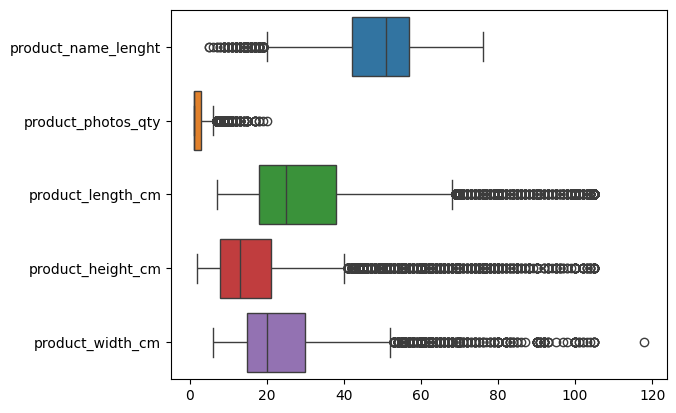

In [445]:
df_filtered = products_df.drop(columns=['product_weight_g', 'product_description_lenght'])

sns.boxplot(data=df_filtered.select_dtypes(include=[np.number]), orient='h')
plt.show()

<Axes: xlabel='product_photos_qty'>

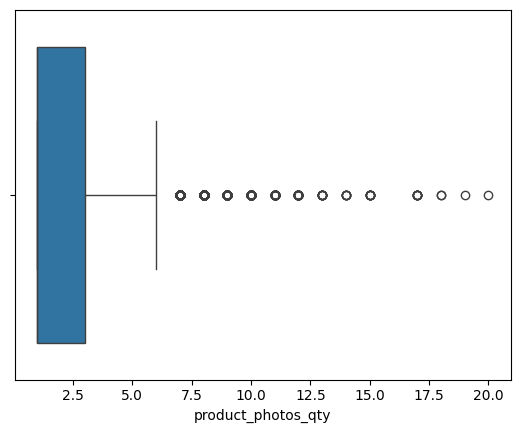

In [446]:
sns.boxplot(data=products_df["product_photos_qty"], orient="h")

**Insight:**
- Sepertinya ada data outliers pada kolom description length dan product_weight_g

**4. Menilai Product_category_name_translation_df**
- Untuk urutan proses sama seperti sebelumnya

In [447]:
product_category_name_translation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


**Insight:**
- Tidak ada masalah pada data
- Selanjutnya kita lihat jumlah duplikasinya

In [448]:
print("Jumlah duplikasi: ", product_category_name_translation_df.duplicated().sum())

Jumlah duplikasi:  0


In [449]:
product_category_name_translation_df.describe()

,product_category_name,product_category_name_english
count,71,71
unique,71,71
top,beleza_saude,health_beauty
freq,1,1


**Insight:**
- Terlihat tida ada masalah pada datanya

**5. Menilai Data Orders_df**

In [450]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [451]:
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


**Insight:**
- Terdapat Missing Value pada 3 kolom
- Terdapat beberapa kolom yang salah data type nya seharusnya menggunakan datetime format

In [452]:
orders_df.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

**Insight:**
- Dapat kita lihat bahwa banyak sekali missing value nya

In [453]:
print("Jumlah duplikasi: ", orders_df.duplicated().sum())

Jumlah duplikasi:  0


In [454]:
orders_df.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


**Insight:**
- Dalam data tersebut hanya terdapat kolom kategorikal saja
- Dalam hal ini juga tidak ada masalah

**6. Menilai Data Orders_Item_df**

In [455]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [456]:
order_items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


**Insight:**
- Terdapat kesalahan pada data type nya yaitu seharusnya kolom shipping _limit_date menggunakan datetime

In [457]:
print("Jumlah duplikasi: ", order_items_df.duplicated().sum())

Jumlah duplikasi:  0


In [458]:
order_items_df.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


**Insight:**
- Dalam data ini kita akan coba cek untuk price 0.85 dan freight value nya 0

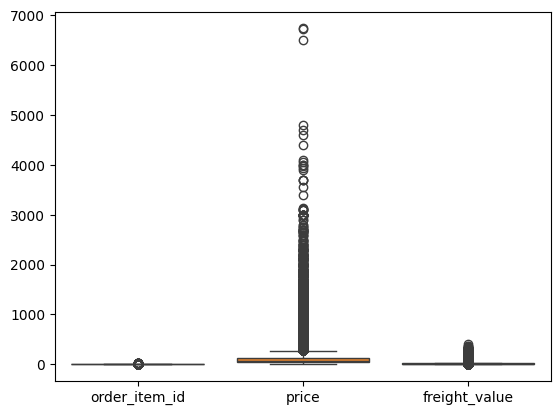

In [459]:
sns.boxplot(data=order_items_df.select_dtypes(include=[np.number]))
plt.show()

**Insight:**
- Sepertinya terdapat outliers

**7. Menilai Data Order_Payment_df**

In [460]:
order_payments_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


**Insight:**
- Disini kita mencoba untuk melihat bentuk data nya seperti apa

In [461]:
order_payments_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


**Insight:**
- Terlihat tidak ada data yang bermasalah

In [462]:
print("Jumlah duplikasi: ", order_payments_df.duplicated().sum())

Jumlah duplikasi:  0


In [463]:
order_payments_df.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


**Insight:**
- Kita akan coba cek nilai payment installment dan payment value yang bernilai 0

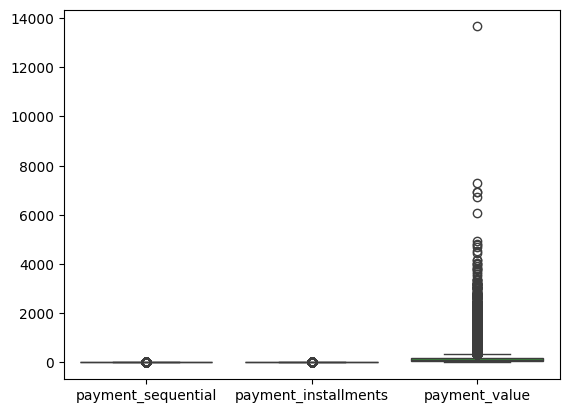

In [464]:
sns.boxplot(data=order_payments_df.select_dtypes(include=[np.number]))
plt.show()

**8. Menilai Data Order_review_df**

In [465]:
order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [466]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


**Insight:**
- Terdapat missing value pada 2 kolom data
- Terdapat kesalaha tipe data pada kolom review_creation_date dan review_answer_timestamp yang seharusnya datetime
- Selanjutnya untuk melihat berapa banyak data yang hilang kita akan pastikan dengan method isna()

In [467]:
order_reviews_df.isna().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

**Insight:**
- Terlihat bahwa terdapat banyak sekali missing value

In [468]:
print("Jumlah duplikasi: ", order_reviews_df.duplicated().sum())

Jumlah duplikasi:  0


In [469]:
order_reviews_df.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


**Insight:**
- Terlihat tidak ada masalah

**9. Menilai Data Geolocation_df**

In [470]:
geolocation_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [471]:
geolocation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


**Insight:**
- Terlihat tidak ada masalah

In [472]:
print("Jumlah duplikasi: ", geolocation_df.duplicated().sum())

Jumlah duplikasi:  261831


**Insight:**
- Dapat kita lihat bahwa banyak sekali data yang duplikat

In [473]:
geolocation_df.describe()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


**Insight:**
- Dari data tersebut terlihat tidak ada data yang bermasalah, dan std nya juga tidak terlalu jauh dari mean

### Cleaning Data

**Insight:**
- Setelah kita lakukan assessing data, ternyata tidak semua dataset perlu untuk dilakukan cleaning, seperti data customers_df dan sellers_df

**1. Membersihkan data products_df**
- Hal pertama yang ingin kita solve adalah missing value, untuk itu kita coba lihat dulu data yang mengalami missing value

In [474]:
products_df[products_df.product_category_name.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


**Insight:**
- Berhubung kita tidak memiliki dataset lain yang bisa kita merge berdasarkan product_id jadi kita coba carikan cara lainnya.
- Untuk mengatasi nilai NaN tersebut, kita coba untuk gunakan metode imputation dengan melihat kategori dominan yang ada dalam dataset untuk menggantikan nilai NaN, karena sayang sekali apabila 610 data kita drop semua.
- Kita gunakan `value_counts()` untuk mengidentifikasi kategori dominan

In [475]:
products_df.product_category_name.value_counts()

product_category_name
cama_mesa_banho                  3029
esporte_lazer                    2867
moveis_decoracao                 2657
beleza_saude                     2444
utilidades_domesticas            2335
                                 ... 
fashion_roupa_infanto_juvenil       5
casa_conforto_2                     5
pc_gamer                            3
seguros_e_servicos                  2
cds_dvds_musicais                   1
Name: count, Length: 73, dtype: int64

**Insight:**
- Kita bisa lihat bahwa kategori paling dominan adalah `cama_mesa_banho`
- Kita akan isikan nama kategori tersebut pada kolom data yang missing dengan menggunakan method `fillna()`

In [476]:
products_df["product_category_name"].fillna(value="cama_mesa_banho", inplace=True)

/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/3788208759.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





**Insight:**
- Kita gantikan semua data yang NaN pada kolom `product_category_name` dengan `cama_mesa_banho`. `inplace=True` digunakan untuk mengganti secara langsung data pada dataset.
- Kita akan coba cek lagi kolom NaN yang masih tersisa

In [477]:
products_df.isna().sum()

product_id                      0
product_category_name           0
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

**Insight:**
- Dari data tersebut kolom `product_category_name` sudah tidak NaN lagi
- Kita lanjutkan proses fill data seperti sebelumnya pada kolom yang lainnya
- Kita juga akan gunakan metode imputasi dengan `modus` dan `median`
- Untuk data data yang bernilai umum seperti category dan qty kita gunakan `modus`, sedangkan untuk data spesifik seperti berat dan panjang kita gunakan `median` agar distribusi data tetap baik.

In [478]:
products_df.product_name_lenght.value_counts().head(3)

product_name_lenght
60.0    2182
59.0    2025
58.0    1887
Name: count, dtype: int64

In [479]:
products_df.product_description_lenght.value_counts().head(3)

product_description_lenght
404.0    94
729.0    86
651.0    66
Name: count, dtype: int64

In [480]:
products_df.product_photos_qty.value_counts().head(3)

product_photos_qty
1.0    16489
2.0     6263
3.0     3860
Name: count, dtype: int64

In [481]:
products_df[['product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']].median()

product_weight_g     700.0
product_length_cm     25.0
product_height_cm     13.0
product_width_cm      20.0
dtype: float64

**Insight:**
- Oke setelah kita dapatkan modus dan median pada masing masing kolom, kita akan melakukan fill data.
- Tapi sebelumnya kita cek lagi data type dari masing masing kolom

In [482]:
products_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32951 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [483]:
products_df.fillna({"product_name_lenght": 60.0}, inplace=True)
products_df.fillna({"product_description_lenght": 404.0}, inplace=True)
products_df.fillna({"product_photos_qty": 1.0}, inplace=True)
products_df.fillna({"product_weight_g": 700.0}, inplace=True)
products_df.fillna({"product_length_cm": 25.0}, inplace=True)
products_df.fillna({"product_height_cm": 13.0}, inplace=True)
products_df.fillna({"product_width_cm": 20.0}, inplace=True)

**Insight:**
- Sekarang kita cek lagi jumlah data NaN nya

In [484]:
products_df.isna().sum()

product_id                    0
product_category_name         0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64

**Insight:**
- Dapat kita lihat bahwa sudah tidak ada lagi missing value pada `products_df`
- Selanjutnya kita coba cek produk dengan berat 0 gram yang mana terlihat tidak mungkin ada produk yang tidak memiliki berat kecuali produk digital

In [485]:
products_df[products_df["product_weight_g"] == 0]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
9769,81781c0fed9fe1ad6e8c81fca1e1cb08,cama_mesa_banho,51.0,529.0,1.0,0.0,30.0,25.0,30.0
13683,8038040ee2a71048d4bdbbdc985b69ab,cama_mesa_banho,48.0,528.0,1.0,0.0,30.0,25.0,30.0
14997,36ba42dd187055e1fbe943b2d11430ca,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
32079,e673e90efa65a5409ff4196c038bb5af,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0


**Insight:**
- Ternyata produk ini memiliki dimensi panjang, lebar dan tinggi dan kebetulan sama semua dimensi ukurannya ketiga data ini
- Kita coba lihat referensi data lain dengan dimensi yang sama untuk fill data weight yang bernilai 0 itu.

In [486]:
filtered_for_median = products_df[(products_df["product_length_cm"] == 30.0) & (products_df["product_height_cm"] == 25.0) & (products_df["product_width_cm"] == 30.0)]

**Insight:**
- Nah dari hasil ini kita akan coba cari median dari weight terkait

In [487]:
filtered_for_median["product_weight_g"].median()

np.float64(2000.0)

In [488]:
products_df.loc[products_df["product_weight_g"] == 0.0, "product_weight_g"] = 200.0

**Insight:**
- Nah disini kita telah mengganti weight yang awalnya 0 menjadi 200. kita langsung mengganti valuenya pada dataset asli.
- Oke lanjut kita akan perbaiki data **outliers**

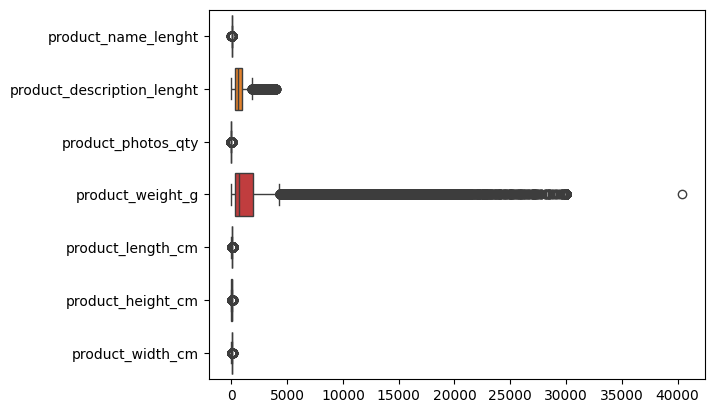

In [489]:
sns.boxplot(data=products_df, orient='h')
plt.show()

**Insight:**
- Ternyata banyak sekali outliers disini
- Kita akan gunakan metode imputasi untuk memperbaiki outliersnya

In [490]:
def replace_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    maximum = Q3 + (1.5 * IQR)
    minimum = Q1 - (1.5 * IQR)

    kondisi_lower_than = df[column_name] < minimum
    kondisi_more_than = df[column_name] > maximum

    df.loc[kondisi_lower_than, column_name] = minimum
    df.loc[kondisi_more_than, column_name] = maximum

    return df

In [491]:
replace_outliers(products_df, "product_name_lenght")
replace_outliers(products_df, "product_description_lenght")
replace_outliers(products_df, "product_photos_qty")
replace_outliers(products_df, "product_weight_g")
replace_outliers(products_df, "product_length_cm")
replace_outliers(products_df, "product_height_cm")
replace_outliers(products_df, "product_width_cm")

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,4300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


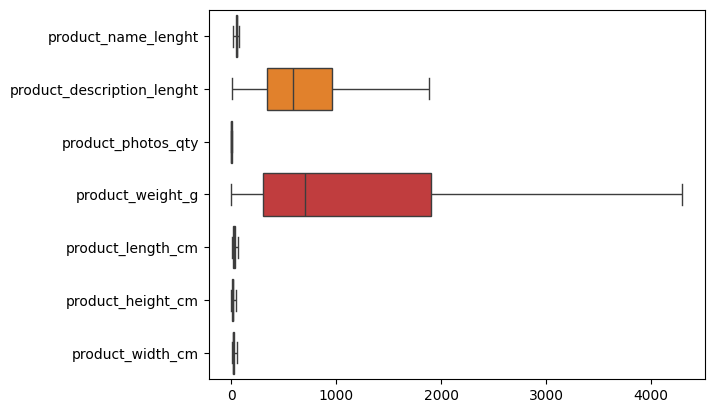

In [492]:
sns.boxplot(data=products_df, orient='h')
plt.show()

**Insight:**
- Oke sekarang data sudah bersih tidak ada outliers

**2. Membersihkan Data orders_df**

- Pertama kita akan perbaiki data type
- Kita cek dulu mana aja kolom yang salah data typenya

In [493]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [494]:
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


**Insight:**
- Bisa kita lihat bahwa hampir semua kolomnya salah data type nya, seharusnya menggunakan datetime sebagai tipe datanya
- Kita akan ubah semua tipe data yang menampilkan date menjadi `datetime`

In [495]:
datetime_columns = ["order_purchase_timestamp",	"order_approved_at",	"order_delivered_carrier_date",	"order_delivered_customer_date", "order_estimated_delivery_date"]
for column in datetime_columns:
  orders_df[column] = pd.to_datetime(orders_df[column])

**Insight:**
- Pada tahap ini kita ubah semua data type pada kolum tersebut menjadi datetime
- Kita akan cek apakah hasilnya sudah sesuai

In [496]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


**Insight:**
- Nah akhirnya semua data type sudah sesuai
- Selanjutnya kita akan perbaiki masalah missing value

In [497]:
orders_df.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [498]:
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


- Kita akan coba cek kolom yang NaN

In [499]:
orders_df[orders_df["order_delivered_carrier_date"].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaT,NaT,2017-10-03
266,8e24261a7e58791d10cb1bf9da94df5c,64a254d30eed42cd0e6c36dddb88adf0,unavailable,2017-11-16 15:09:28,2017-11-16 15:26:57,NaT,NaT,2017-12-05
324,d3c8851a6651eeff2f73b0e011ac45d0,957f8e082185574de25992dc659ebbc0,processing,2016-10-05 22:44:13,2016-10-06 15:51:05,NaT,NaT,2016-12-09
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaT,NaT,2018-02-06
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15


**Insight:**
- Disini kita akan menggunakan metode `interpolation` untuk menangani missing value dengan data tipe datetime ini
- Pada kode ini kita akan mengisi semua missing value dengan method linear yaitu dengan menarik garis lurus nilainya sesuai dengan data pada kolom tersebut
- Mari kita lakukan metode ini kesemua kolom yang mengalami missing value

In [500]:
orders_df["order_approved_at"].interpolate(method="linear", limit_direction="forward", inplace=True)

/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/2583193144.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [501]:
orders_df["order_delivered_carrier_date"].interpolate(method="linear", limit_direction="forward", inplace=True)
orders_df["order_delivered_customer_date"].interpolate(method="linear", limit_direction="forward", inplace=True)

/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/3955230824.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/3955230824.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing '

- Setelah selesai, mari kita cek kembali jumlah data yang hilang

In [502]:
orders_df.isna().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

**Insight:**
- Terlihat data sudah normal

**3. Membersihkan data order_item_df**

In [503]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


**Insight:**
- Terdapat kesalah data type pada kolom `shipping_limit_date`
- Kita akan ganti data type pada kolom tersebut

In [504]:
order_items_df["shipping_limit_date"] = pd.to_datetime(order_items_df["shipping_limit_date"])

In [505]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


**Insight:**
- Nah sudah selesai
- Selanjutnya kita akan hilangkan outliers
- Kita cek kembali menggunakan boxplot

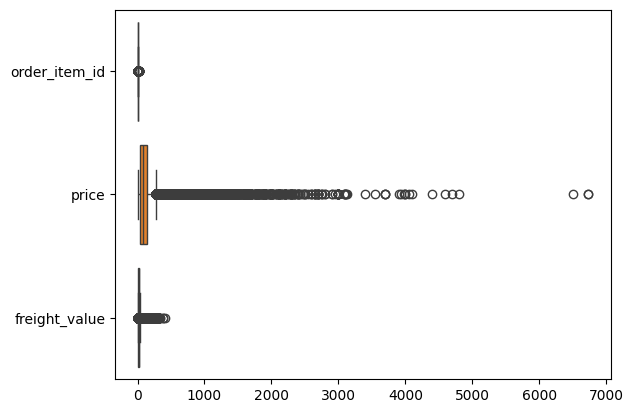

In [506]:
sns.boxplot(data=order_items_df, orient="h")
plt.show()

**Insight:**
- Terlihat banyak sekali outliers, kita akan segera perbaiki
- Kita akan gunakan lagi function `replace_outliers` yang sudah kita buat sebelumnya

In [507]:
replace_outliers(order_items_df, "order_item_id")
replace_outliers(order_items_df, "price")
replace_outliers(order_items_df, "freight_value")

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.290
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.930
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.870
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.790
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.140
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,277.40,33.255
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,277.40,33.255
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.950
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.720


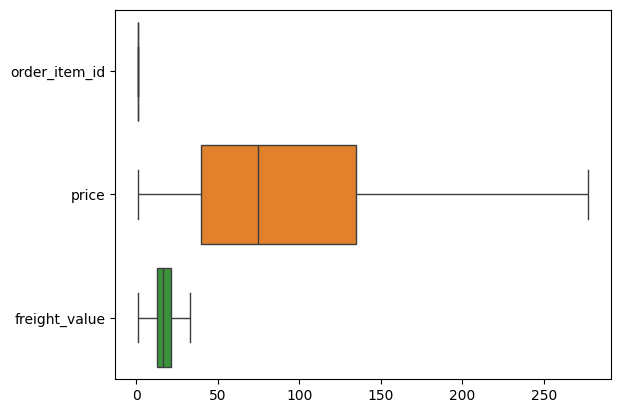

In [508]:
sns.boxplot(data=order_items_df, orient="h")
plt.show()

**Insight:**
- Terlihat data sudah lebih bersih

**4. Membersihkan data order_payments_df**

In [509]:
order_payments_df.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


**Insight:**
- Terlihat terdapat payment value yang bernilai 0

In [510]:
order_payments_df[order_payments_df["payment_value"] == 0]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.0
36822,fa65dad1b0e818e3ccc5cb0e39231352,14,voucher,1,0.0
43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.0
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.0
77885,fa65dad1b0e818e3ccc5cb0e39231352,13,voucher,1,0.0
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0
100766,b23878b3e8eb4d25a158f57d96331b18,4,voucher,1,0.0


**Insight:**
- payment value 0 sepertinya sudah benar ya karena payment_type menggunakan voucher
- Kita lanjut untuk membersihkan outliers

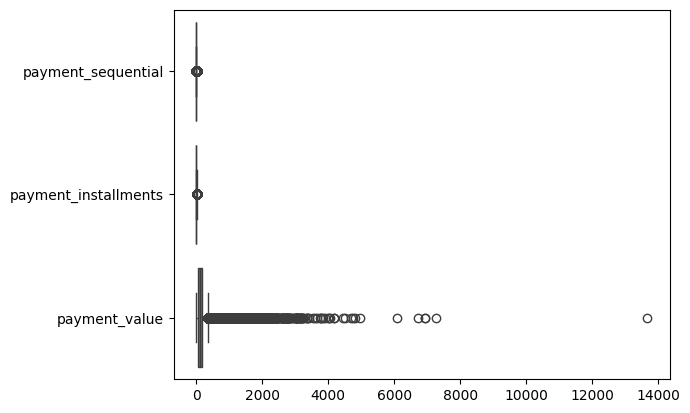

In [511]:
sns.boxplot(data=order_payments_df, orient="h")
plt.show()

**Insight:**
- Terlihat cukup banyak outliers pada kolom payment_value
- Kita akan panggil kembali function `replace_outliers`

In [512]:
replace_outliers(order_payments_df, "payment_sequential")
replace_outliers(order_payments_df, "payment_installments")
replace_outliers(order_payments_df, "payment_value")

/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/96980812.py:12: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-3.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8.0,99.33000
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1.0,24.39000
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1.0,65.71000
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8.0,107.78000
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2.0,128.45000
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1.0,344.40875
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2.0,96.80000
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1.0,47.77000
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5.0,344.40875


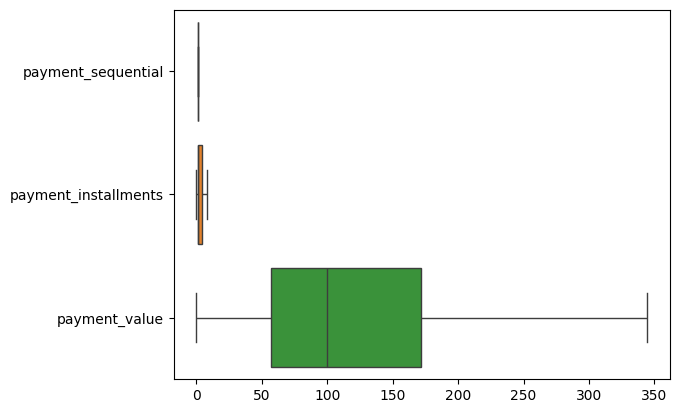

In [513]:
sns.boxplot(data=order_payments_df, orient="h")
plt.show()

**Insight:**
- Oke data sudah bagus

**5. Membersihkan data order_reviews_df**

In [514]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [515]:
order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


**Insight:**
- Terlihat terdapat missing value dan juga salah data type
- Kita akan perbaiki data type nya dulu

In [516]:
order_reviews_df_column = ["review_creation_date", "review_answer_timestamp"]

for column in order_reviews_df_column:
  order_reviews_df[column] = pd.to_datetime(order_reviews_df[column])

**Insight:**
- Selanjutnya kita isi missing value
- Kali ini kita akan gunakan modus, karena data bersifat kategorikal nominal

In [517]:
order_reviews_df.review_comment_title.value_counts().head(3)

review_comment_title
Recomendo    423
recomendo    345
Bom          293
Name: count, dtype: int64

In [518]:
order_reviews_df.review_comment_message.value_counts().head(3)

review_comment_message
Muito bom    230
Bom          189
muito bom    122
Name: count, dtype: int64

In [519]:
order_reviews_df.fillna({"review_comment_title": "Recomendo"}, inplace=True)
order_reviews_df.fillna({"review_comment_message": "Muito bom"}, inplace=True)

In [520]:
order_reviews_df.isna().sum()

review_id                  0
order_id                   0
review_score               0
review_comment_title       0
review_comment_message     0
review_creation_date       0
review_answer_timestamp    0
dtype: int64

**Insight:**
- Nah sekarang sudah tidak ada missing value

**6. Membersihkan data geolocation_df**

In [521]:
print("Jumlah duplikasi: ", geolocation_df.duplicated().sum())

Jumlah duplikasi:  261831


**Insight:**
- Terlihat banyak duplikasi
- Kita akan segera drop semua data yang duplikat

In [522]:
geolocation_df.drop_duplicates(inplace=True)

In [523]:
print("Jumlah duplikasi: ", geolocation_df.duplicated().sum())

Jumlah duplikasi:  0


In [524]:
print(orders_df['order_id'].nunique())

print(order_reviews_df['order_id'].nunique())

print(order_reviews_df['order_id'].nunique())

99441
98673
98673


**Insight:**
- Nah seperti yang terlihat, sekarang data sudah bersih dari duplikat

## Exploratory Data Analysis (EDA)

### Explore ...

**1. Explorasi data customers_df**

In [525]:
customers_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


**Insight:**
- Bisa kita lihat bahwa data customer memuat informasi seperti zip code, city dan state
- Kita coba kelompokkan jumlah customer per kota nya

In [526]:
customers_df.groupby(by="customer_city").customer_id.nunique().sort_values(ascending=False)

customer_city
sao paulo         15540
rio de janeiro     6882
belo horizonte     2773
brasilia           2131
curitiba           1521
                  ...  
ibiara                1
rio espera            1
rio dos indios        1
rio dos cedros        1
lagoao                1
Name: customer_id, Length: 4119, dtype: int64

In [527]:
customers_df.groupby(by="customer_state").customer_id.nunique().sort_values(ascending=False)

customer_state
SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: customer_id, dtype: int64

**Insight:**
- Dari data tersebut, didapat bahwa kebanyakan customer kita berasal dari kota sao paulo, rio de janeiro dan belo horizonte
- Selain itu customer banyak berasal dari negara bagian SP, RJ dan MG

**2. Explorasi data sellers_df**

In [528]:
sellers_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [529]:
sellers_df.groupby(by="seller_city").seller_id.nunique().sort_values(ascending=False)

seller_city
sao paulo         694
curitiba          127
rio de janeiro     96
belo horizonte     68
ribeirao preto     52
                 ... 
ivoti               1
itirapina           1
itau de minas       1
itapui              1
xaxim               1
Name: seller_id, Length: 611, dtype: int64

In [530]:
sellers_df.groupby(by="seller_state").seller_id.nunique().sort_values(ascending=False)

seller_state
SP    1849
PR     349
MG     244
SC     190
RJ     171
RS     129
GO      40
DF      30
ES      23
BA      19
CE      13
PE       9
PB       6
MS       5
RN       5
MT       4
RO       2
SE       2
AC       1
PI       1
AM       1
MA       1
PA       1
Name: seller_id, dtype: int64

**Insight:**
- Dari sini kita bisa lihat bahwa seller banyak berasal dari kota sao paulo, curitiba, dan rio de janeiro, selain itu juga berasal dari negara bagian SP, PR, dan MG
- Berdasarkan data customer dan seller, ternyata banyak di dominasi dari kota Sao Paulo dan Rio de Janeiro serta negara bagian SP dan MG

**3. Explorasi data products_df**

In [531]:
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [532]:
products_df.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32951.000000,32951.000000,32951.000000,32951.000000,32951.000000,32951.000000,32951.000000
mean,48.720524,721.800522,2.101272,1359.471154,30.146581,15.980577,22.874814
std,10.173071,499.440364,1.486010,1431.393320,14.770384,10.583820,10.946578
min,19.500000,4.000000,1.000000,2.000000,7.000000,2.000000,6.000000
25%,42.000000,344.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,52.000000,584.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,961.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,1886.500000,6.000000,4300.000000,68.000000,40.500000,52.500000


In [533]:
product_category_name_translation_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [534]:
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


In [535]:
orders_df.groupby(by="order_status").order_id.nunique().sort_values(ascending=False)

order_status
delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_id, dtype: int64

In [536]:
result_df = orders_df.groupby('order_status').order_id.nunique().reset_index().assign(order_status=lambda x: x['order_status'].where(x['order_status'] == 'delivered', 'others')).groupby('order_status').sum().reset_index().sort_values(by='order_id', ascending=False)
result_df

,order_status,order_id
0,delivered,96478
1,others,2963


**Insight:**
- Kita lihat disini data others hanya sekitar 3% dari keseluruhan data, dan untuk kategori selain delivered sepertinya tidak diperlukan untuk analisa kita kali ini, kita akan fokus pada data yang delivered

In [537]:
delivered_orders_df = orders_df[orders_df["order_status"] == "delivered"]
delivered_orders_df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15


**Insight:**
- Disini kita akan coba cari delivery_time untuk menghitung lamanya pesanan sampai ke customer
- Kita akan gunakan data dari order_approved_at sebagai start date.
- Setelah itu kita akan buat kolom baru untuk menyimpan nilai delivery_time
- disini yang kita gunakan bukan dari orders_df, melainkan kita pakai data delivered_orders_df agar datanya lebih akurat

In [538]:
delivery_time = delivered_orders_df["order_delivered_customer_date"] - delivered_orders_df["order_approved_at"]
delivery_time = delivery_time.apply(lambda x: x.total_seconds())
delivered_orders_df["delivery_time"] = round(delivery_time/86400)

/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/3252588209.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [539]:
delivered_orders_df.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time
count,96478,96478,96478,96478,96478,96478.000000
mean,2018-01-01 23:29:31.939913984,2018-01-02 11:05:30.058894080,2018-01-05 05:03:22.056639744,2018-01-14 12:39:56.711851264,2018-01-25 17:09:52.325711616,12.055121
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00,-491.000000
25%,2017-09-14 09:00:23.249999872,2017-09-14 14:53:57.249999872,2017-09-18 16:47:13,2017-09-25 22:18:14.500000,2017-10-05 00:00:00,6.000000
50%,2018-01-20 19:45:45,2018-01-22 13:50:07,2018-01-24 16:14:58,2018-02-02 19:28:32,2018-02-16 00:00:00,10.000000
75%,2018-05-05 18:54:47,2018-05-06 11:10:29.249999872,2018-05-08 14:34:45,2018-05-15 22:48:15.750000128,2018-05-28 00:00:00,15.000000
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,316.000000
std,NaN,NaN,NaN,NaN,NaN,10.800983


**Insight:**
- Disini kita lihat ada data aneh yang mana delivery_time nya malah minus, kita akan coba cek datanya

In [540]:
delivered_orders_df[delivered_orders_df["delivery_time"] < 0].info()

<class 'pandas.core.frame.DataFrame'>
Index: 59 entries, 199 to 98038
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       59 non-null     object        
 1   customer_id                    59 non-null     object        
 2   order_status                   59 non-null     object        
 3   order_purchase_timestamp       59 non-null     datetime64[ns]
 4   order_approved_at              59 non-null     datetime64[ns]
 5   order_delivered_carrier_date   59 non-null     datetime64[ns]
 6   order_delivered_customer_date  59 non-null     datetime64[ns]
 7   order_estimated_delivery_date  59 non-null     datetime64[ns]
 8   delivery_time                  59 non-null     float64       
dtypes: datetime64[ns](5), float64(1), object(3)
memory usage: 4.6+ KB


In [541]:
delivered_orders_df[delivered_orders_df["delivery_time"] < 0].head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time
199,58d4c4747ee059eeeb865b349b41f53a,1755fad7863475346bc6c3773fe055d3,delivered,2018-07-21 12:49:32,2018-07-26 23:31:53,2018-07-24 12:57:00,2018-07-25 23:58:19,2018-07-31,-1.0
483,4df92d82d79c3b52c7138679fa9b07fc,ba0660bf3fffe505ee892e153a2fbd49,delivered,2018-07-24 11:32:11,2018-07-29 23:30:52,2018-07-26 14:46:00,2018-07-27 18:55:57,2018-08-06,-2.0
1986,6e57e23ecac1ae881286657694444267,2dda54e25d0984e12705c84d4030e6e0,delivered,2018-08-09 17:36:47,2018-08-20 15:55:42,2018-08-14 13:26:00,2018-08-17 16:45:45,2018-09-06,-3.0
3002,2d1e2d5bf4dc7227b3bfebb81328c15f,ec05a6d8558c6455f0cbbd8a420ad34f,delivered,2017-11-28 17:44:07,2017-11-28 17:56:40,2017-11-30 18:12:23,2017-11-09 06:57:18,2017-12-18,-19.0
3659,f222c56f035b47dfa1e069a88235d730,b74ca180d63f9ae0443e4e13a2f5bdaf,delivered,2018-01-30 09:43:45,2018-02-04 23:31:47,2018-01-31 19:48:44,2018-02-01 20:10:38,2018-02-15,-3.0


**Insight:**
- Ternyata ada beberapa data dengan delivery time yang minus yang mana data ini tidak valid, karena jumlahnya hanya 59 kita akan drop datanya

In [542]:
delivery_time_index_to_drop = delivered_orders_df[delivered_orders_df["delivery_time"] < 0].index
delivered_orders_df.drop(delivery_time_index_to_drop, inplace=True)

/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/1203847668.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [543]:
delivered_orders_df.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time
count,96419,96419,96419,96419,96419,96419.000000
mean,2018-01-01 23:26:27.488544768,2018-01-02 09:39:10.578361088,2018-01-05 05:00:23.675100416,2018-01-14 12:59:03.625229568,2018-01-25 17:10:17.591968256,12.128315
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00,-0.000000
25%,2017-09-14 09:39:02.500000,2017-09-14 14:42:23,2017-09-18 17:12:39.500000,2017-09-25 23:09:44,2017-10-05 00:00:00,6.000000
50%,2018-01-20 19:20:06,2018-01-22 13:47:46,2018-01-24 15:59:59,2018-02-02 19:28:34,2018-02-16 00:00:00,10.000000
75%,2018-05-05 17:39:38.500000,2018-05-06 04:29:44.500000,2018-05-08 14:22:00,2018-05-15 22:13:23.500000,2018-05-28 00:00:00,15.000000
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,316.000000
std,NaN,NaN,NaN,NaN,NaN,9.568111


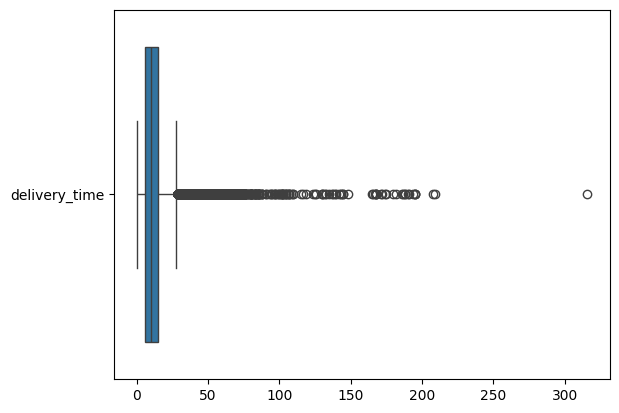

In [544]:
sns.boxplot(data=delivered_orders_df, orient='h')
plt.show()

**Insight:**
- Kita akan bersihkan outliersnya dulu

In [545]:
replace_outliers(delivered_orders_df, "delivery_time")

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,13.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,13.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3.0
...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,8.0
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,22.0
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,25.0
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,17.0


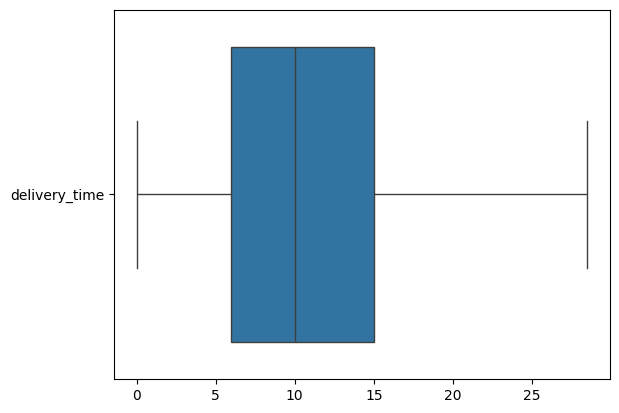

In [546]:
sns.boxplot(data=delivered_orders_df, orient='h')
plt.show()

In [547]:
delivered_orders_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96419 entries, 0 to 99440
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96419 non-null  object        
 1   customer_id                    96419 non-null  object        
 2   order_status                   96419 non-null  object        
 3   order_purchase_timestamp       96419 non-null  datetime64[ns]
 4   order_approved_at              96419 non-null  datetime64[ns]
 5   order_delivered_carrier_date   96419 non-null  datetime64[ns]
 6   order_delivered_customer_date  96419 non-null  datetime64[ns]
 7   order_estimated_delivery_date  96419 non-null  datetime64[ns]
 8   delivery_time                  96419 non-null  float64       
dtypes: datetime64[ns](5), float64(1), object(3)
memory usage: 7.4+ MB


In [548]:
delivered_orders_df.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time
count,96419,96419,96419,96419,96419,96419.000000
mean,2018-01-01 23:26:27.488544768,2018-01-02 09:39:10.578361088,2018-01-05 05:00:23.675100416,2018-01-14 12:59:03.625229568,2018-01-25 17:10:17.591968256,11.525871
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00,-0.000000
25%,2017-09-14 09:39:02.500000,2017-09-14 14:42:23,2017-09-18 17:12:39.500000,2017-09-25 23:09:44,2017-10-05 00:00:00,6.000000
50%,2018-01-20 19:20:06,2018-01-22 13:47:46,2018-01-24 15:59:59,2018-02-02 19:28:34,2018-02-16 00:00:00,10.000000
75%,2018-05-05 17:39:38.500000,2018-05-06 04:29:44.500000,2018-05-08 14:22:00,2018-05-15 22:13:23.500000,2018-05-28 00:00:00,15.000000
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,28.500000
std,NaN,NaN,NaN,NaN,NaN,7.082034


**Insight:**
- Dari data ini kita bisa lihat bahwa rata-rata pengiriman adalah selama 11 hari dengan nilai maksimum selama 28 hari, dan nilai minimumnya tidak ada 1 hari.



In [549]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


In [550]:
order_items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


**Insight:**
- Kita akan coba cari produk mana yang sering di order oleh pembeli berdasarkan kedua dataset order_df dan order_items ini.
- Kita disini akan menganalisa berdasarkan produk yang memang sudah terkirim ke customer
- Tapi sebelumnya Kita akan gabungkan antara data order_item_df dengan products_df
- Selain itu kita juga harus translate nama produk nya kedalam bahasa inggris agar lebih mudah dimengerti

In [551]:
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [552]:
product_category_name_translation_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [553]:
translated_products_df = pd.merge(
    left=products_df,
    right=product_category_name_translation_df,
    how='left',
    left_on="product_category_name",
    right_on="product_category_name"
)
translated_products_df

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares
...,...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,4300.0,40.0,40.0,40.0,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0,computers_accessories


In [554]:
order_items_products_df = pd.merge(
    left=order_items_df,
    right=translated_products_df,
    how='left',
    left_on="product_id",
    right_on="product_id"
)

order_items_products_df

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.290,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.930,pet_shop,56.0,239.0,2.0,4300.0,50.0,30.0,40.0,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.870,moveis_decoracao,59.0,695.0,2.0,3050.0,33.0,13.0,33.0,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.790,perfumaria,42.0,480.0,1.0,200.0,16.0,10.0,15.0,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.140,ferramentas_jardim,59.0,409.0,1.0,3750.0,35.0,40.0,30.0,garden_tools
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,277.40,33.255,utilidades_domesticas,43.0,1002.0,3.0,4300.0,68.0,15.0,40.0,housewares
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,277.40,33.255,informatica_acessorios,31.0,232.0,1.0,4300.0,45.0,26.0,38.0,computers_accessories
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.950,esporte_lazer,43.0,869.0,1.0,967.0,21.0,24.0,19.0,sports_leisure
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.720,informatica_acessorios,56.0,1306.0,1.0,100.0,20.0,20.0,20.0,computers_accessories


In [555]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


In [556]:
order_items_products_df.isna().sum()

order_id                          0
order_item_id                     0
product_id                        0
seller_id                         0
shipping_limit_date               0
price                             0
freight_value                     0
product_category_name             0
product_name_lenght               0
product_description_lenght        0
product_photos_qty                0
product_weight_g                  0
product_length_cm                 0
product_height_cm                 0
product_width_cm                  0
product_category_name_english    24
dtype: int64

In [557]:
missing_data = order_items_products_df.isna().sum()
missing_percentage = (missing_data / len(order_items_products_df)) * 100
print(missing_percentage)

order_id                         0.000000
order_item_id                    0.000000
product_id                       0.000000
seller_id                        0.000000
shipping_limit_date              0.000000
price                            0.000000
freight_value                    0.000000
product_category_name            0.000000
product_name_lenght              0.000000
product_description_lenght       0.000000
product_photos_qty               0.000000
product_weight_g                 0.000000
product_length_cm                0.000000
product_height_cm                0.000000
product_width_cm                 0.000000
product_category_name_english    0.021305
dtype: float64


**Insight:**
- Ternyata banyak data yang dengan status NaN setelah kita merge, ini berarti ada beberapa data products yang hilang
- Karena data nya cukup banyak dan sayang klo langsung di drop kita akan lakukan imputasi

In [558]:
order_items_products_df.product_category_name.value_counts().head(3)

product_category_name
cama_mesa_banho    12718
beleza_saude        9670
esporte_lazer       8641
Name: count, dtype: int64

In [559]:
order_items_products_df.product_name_lenght.value_counts().head(3)

product_name_lenght
60.0    9316
59.0    8322
56.0    6504
Name: count, dtype: int64

In [560]:
order_items_products_df.product_description_lenght.value_counts().head(3)

product_description_lenght
1886.5    8135
404.0     1798
341.0      690
Name: count, dtype: int64

In [561]:
order_items_products_df[['product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']].median()

product_photos_qty      1.0
product_weight_g      700.0
product_length_cm      25.0
product_height_cm      13.0
product_width_cm       20.0
dtype: float64

In [562]:
order_items_products_df.fillna({"product_category_name": "cama_mesa_banho"}, inplace=True)
order_items_products_df.fillna({"product_name_lenght": 60.0}, inplace=True)
order_items_products_df.fillna({"product_description_lenght": 2890.0}, inplace=True)
order_items_products_df.fillna({"product_photos_qty": 1.0}, inplace=True)
order_items_products_df.fillna({"product_weight_g": 550.0}, inplace=True)
order_items_products_df.fillna({"product_length_cm": 22.0}, inplace=True)
order_items_products_df.fillna({"product_height_cm": 12.0}, inplace=True)
order_items_products_df.fillna({"product_width_cm": 18.0}, inplace=True)

In [563]:
order_items_products_df.isna().sum()

order_id                          0
order_item_id                     0
product_id                        0
seller_id                         0
shipping_limit_date               0
price                             0
freight_value                     0
product_category_name             0
product_name_lenght               0
product_description_lenght        0
product_photos_qty                0
product_weight_g                  0
product_length_cm                 0
product_height_cm                 0
product_width_cm                  0
product_category_name_english    24
dtype: int64

In [564]:
delivered_order_items_products_df = pd.merge(
    left=delivered_orders_df,
    right=order_items_products_df,
    how='left',
    left_on="order_id",
    right_on="order_id"
)

delivered_order_items_products_df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.720,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,13.0,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.760,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.220,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,13.0,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.200,pet_shop,59.0,468.0,3.0,450.0,30.0,10.0,20.0,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3.0,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.720,papelaria,38.0,316.0,4.0,250.0,51.0,15.0,15.0,stationery
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110126,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,22.0,1,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,2018-02-12 13:10:37,174.90,20.100,bebes,52.0,828.0,4.0,4300.0,40.0,10.0,40.0,baby
110127,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,25.0,1,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,2017-09-05 15:04:16,205.99,33.255,eletrodomesticos_2,51.0,500.0,2.0,4300.0,32.0,40.5,22.0,home_appliances_2
110128,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,17.0,1,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,2018-01-12 21:36:21,179.99,33.255,informatica_acessorios,59.0,1886.5,1.0,4300.0,20.0,20.0,20.0,computers_accessories
110129,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,17.0,1,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,2018-01-12 21:36:21,179.99,33.255,informatica_acessorios,59.0,1886.5,1.0,4300.0,20.0,20.0,20.0,computers_accessories


In [565]:
delivered_order_items_products_df.isna().sum()

order_id                          0
customer_id                       0
order_status                      0
order_purchase_timestamp          0
order_approved_at                 0
order_delivered_carrier_date      0
order_delivered_customer_date     0
order_estimated_delivery_date     0
delivery_time                     0
order_item_id                     0
product_id                        0
seller_id                         0
shipping_limit_date               0
price                             0
freight_value                     0
product_category_name             0
product_name_lenght               0
product_description_lenght        0
product_photos_qty                0
product_weight_g                  0
product_length_cm                 0
product_height_cm                 0
product_width_cm                  0
product_category_name_english    22
dtype: int64

**Insight:**
- Selanjutnya kita akan cari kategori produk apa yang sering dibeli oleh customer

In [566]:
delivered_order_items_products_df.groupby(by='product_category_name_english').agg({
    "product_id" : "nunique",
    "price" : ["min", "max"]
}).sort_values(by=("product_id", "nunique"), ascending=False)

product_id   price        
                                 nunique     min     max
product_category_name_english                           
bed_bath_table                      3573    3.00  277.40
sports_leisure                      2821    4.50  277.40
furniture_decor                     2590    4.90  277.40
health_beauty                       2397    1.20  277.40
housewares                          2282    3.06  277.40
...                                  ...     ...     ...
tablets_printing_image                 9   14.90  277.40
home_comfort_2                         5   12.90  219.99
fashion_childrens_clothes              4   39.99  110.00
security_and_services                  2  100.00  183.29
cds_dvds_musicals                      1   45.00   65.00

[71 rows x 3 columns]

**Insight:**
- Ternyata produk yang sering dibeli adalah bed_bath_table
- Kita akan gabungkan data orders dan order_payments serta order_reviews
- Selanjutnya kita akan eksplore payment type yang digunakan
- Setelah itu kita akan gabungkan juga data customers dengan data order kemudian kita bisa mapping jumlah customer per daerah sesuai geolocation_df

In [567]:
order_payments_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8.0,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1.0,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1.0,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8.0,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2.0,128.45


In [568]:
order_payments_df.groupby(by="payment_type").order_id.count()

payment_type
boleto         19784
credit_card    76795
debit_card      1529
not_defined        3
voucher         5775
Name: order_id, dtype: int64

In [569]:
order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,Recomendo,Muito bom,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,Recomendo,Muito bom,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,Recomendo,Muito bom,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,Recomendo,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,Recomendo,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53


In [570]:
geolocation_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [571]:
orders_df_payment_df = pd.merge(
    left=delivered_order_items_products_df,
    right=order_payments_df,
    how='left',
    left_on='order_id',
    right_on='order_id'
)

orders_df_payment_df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.720,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,1.0,credit_card,1.0,18.12000
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.720,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,1.0,voucher,1.0,2.00000
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.720,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,1.0,voucher,1.0,18.59000
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,13.0,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.760,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,1.0,boleto,1.0,141.46000
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.220,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,1.0,credit_card,3.0,179.12000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114966,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,22.0,1,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,2018-02-12 13:10:37,174.90,20.100,bebes,52.0,828.0,4.0,4300.0,40.0,10.0,40.0,baby,1.0,credit_card,3.0,195.00000
114967,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,25.0,1,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,2017-09-05 15:04:16,205.99,33.255,eletrodomesticos_2,51.0,500.0,2.0,4300.0,32.0,40.5,22.0,home_appliances_2,1.0,credit_card,5.0,271.01000
114968,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,17.0,1,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,2018-01-12 21:36:21,179.99,33.255,informatica_acessorios,59.0,1886.5,1.0,4300.0,20.0,20.0,20.0,computers_accessories,1.0,credit_card,4.0,344.40875
114969,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,17.0,1,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,2018-01-12 21:36:21,179.99,33.255,informatica_acessorios,59.0,1886.5,1.0,4300.0,20.0,20.0,20.0,computers_accessories,1.0,credit_card,4.0,344.40875


**Insight:**
- Disini kita gabungkan data delivered order dengan order payment

In [572]:
orders_payment_reviews_df = pd.merge(
    left=orders_df_payment_df,
    right=order_reviews_df,
    how='left',
    left_on='order_id',
    right_on='order_id'
)

pd.set_option('display.max_columns', None)
orders_payment_reviews_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,1.0,credit_card,1.0,18.12,a54f0611adc9ed256b57ede6b6eb5114,4.0,Recomendo,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,1.0,voucher,1.0,2.00,a54f0611adc9ed256b57ede6b6eb5114,4.0,Recomendo,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.0,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,1.0,voucher,1.0,18.59,a54f0611adc9ed256b57ede6b6eb5114,4.0,Recomendo,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,13.0,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,1.0,boleto,1.0,141.46,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,1.0,credit_card,3.0,179.12,e73b67b67587f7644d5bd1a52deb1b01,5.0,Recomendo,Muito bom,2018-08-18,2018-08-22 19:07:58


**Insight:**
- Selanjutnya kita akan menggabungkan dataframe customers_df dan geolocation_df agar kita mendapatkan dataset customer lengkap dengan alamatnya atau kota nya

In [573]:
selected_customer_df = customers_df[['customer_id', 'customer_zip_code_prefix', 'customer_state']]

geolocation_agg = geolocation_df.groupby('geolocation_zip_code_prefix').agg({
    'geolocation_lat': 'mean',
    'geolocation_lng': 'mean',
    'geolocation_city': 'first',
}).reset_index()

customers_geo_df = selected_customer_df.merge(geolocation_agg, how='left', left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix')

**Insight:**
- Disini kita gunakan aggregate untuk menggabungkan nilainya agar tidak terjadi pembengkakan entries ketika di merge
- Sekarang kita gabungkan data order dengan customer_geo_df

In [574]:
customers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [575]:
customers_geo_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 7 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   customer_id                  99441 non-null  object 
 1   customer_zip_code_prefix     99441 non-null  int64  
 2   customer_state               99441 non-null  object 
 3   geolocation_zip_code_prefix  99163 non-null  float64
 4   geolocation_lat              99163 non-null  float64
 5   geolocation_lng              99163 non-null  float64
 6   geolocation_city             99163 non-null  object 
dtypes: float64(3), int64(1), object(3)
memory usage: 5.3+ MB


In [576]:
customers_geo_df.isna().sum()

customer_id                      0
customer_zip_code_prefix         0
customer_state                   0
geolocation_zip_code_prefix    278
geolocation_lat                278
geolocation_lng                278
geolocation_city               278
dtype: int64

**Insight:**
- Ternyata disini ada missing value
- Setelah ini kita akan imputasi nilai nilai yang missing dengan cara kita pisahkan dulu data yang ada NaN, kemudian kita akan cari modus pada data nominal, dan mean untuk data koordinat, baru setelah itu kita akan imputasi nilai yang missing dan terakhir kita gabungkan kembali datanya

In [577]:
customers_geo_clean_df = customers_geo_df.dropna(subset=['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city'])

zip_code_mode = customers_geo_clean_df.groupby('customer_state')['geolocation_zip_code_prefix'].agg(lambda x: x.mode()[0])
lat_mean = customers_geo_clean_df.groupby('customer_state')['geolocation_lat'].mean()
lng_mean = customers_geo_clean_df.groupby('customer_state')['geolocation_lng'].mean()
city_mode = customers_geo_clean_df.groupby('customer_state')['geolocation_city'].agg(lambda x: x.mode()[0])

def imputasi(row):
    if pd.isna(row['geolocation_zip_code_prefix']):
        row['geolocation_zip_code_prefix'] = zip_code_mode[row['customer_state']]
    if pd.isna(row['geolocation_lat']):
        row['geolocation_lat'] = lat_mean[row['customer_state']]
    if pd.isna(row['geolocation_lng']):
        row['geolocation_lng'] = lng_mean[row['customer_state']]
    if pd.isna(row['geolocation_city']):
        row['geolocation_city'] = city_mode[row['customer_state']]
    return row

customers_geo_data_missing = customers_geo_clean_df[customers_geo_clean_df[['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city']].isna().any(axis=1)]
customers_geo_data_missing = customers_geo_data_missing.apply(imputasi, axis=1)

customers_geo_df = pd.concat([customers_geo_clean_df, customers_geo_data_missing])

print(customers_geo_df.isna().sum())

customer_id                    0
customer_zip_code_prefix       0
customer_state                 0
geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
dtype: int64


**Insight:**
- Data sekarang sudah tidak ada missing value

In [578]:
print(orders_payment_reviews_df.memory_usage(deep=True).sum() / (1024**2), "MB")
print(customers_geo_df.memory_usage(deep=True).sum() / (1024**2), "MB")

107.7794017791748 MB
22.066036224365234 MB


In [579]:
selected_orders_payment_reviews_df = orders_payment_reviews_df[['order_id', 'customer_id', 'order_status', 'order_approved_at', 'order_purchase_timestamp', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'delivery_time', 'product_id', 'seller_id', 'price', 'freight_value', 'product_category_name_english', 'product_category_name', 'payment_sequential', 'payment_type', 'payment_installments',  'payment_value', 'review_score', 'review_comment_title']]
completed_order_geo_df = selected_orders_payment_reviews_df.merge(customers_geo_df, how='left', on='customer_id')
completed_order_geo_df

,order_id,customer_id,order_status,order_approved_at,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,product_id,seller_id,price,freight_value,product_category_name_english,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,customer_zip_code_prefix,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.720,housewares,utilidades_domesticas,1.0,credit_card,1.0,18.12000,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.720,housewares,utilidades_domesticas,1.0,voucher,1.0,2.00000,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.720,housewares,utilidades_domesticas,1.0,voucher,1.0,18.59000,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-26 03:24:27,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70,22.760,perfumery,perfumaria,1.0,boleto,1.0,141.46000,4.0,Muito boa a loja,47813.0,BA,47813.0,-12.186877,-44.540232,barreiras
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:55:23,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,19.220,auto,automotivo,1.0,credit_card,3.0,179.12000,5.0,Recomendo,75265.0,GO,75265.0,-16.745150,-48.514783,vianopolis
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115651,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 13:10:37,2018-02-06 12:58:58,2018-02-28 17:37:56,2018-03-02,22.0,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,174.90,20.100,baby,bebes,1.0,credit_card,3.0,195.00000,4.0,Recomendo,11722.0,SP,11722.0,-24.001334,-46.450022,praia grande
115652,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 15:04:16,2017-08-27 14:46:43,2017-09-21 11:24:17,2017-09-27,25.0,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,205.99,33.255,home_appliances_2,eletrodomesticos_2,1.0,credit_card,5.0,271.01000,5.0,Recomendo,45920.0,BA,45920.0,-17.898045,-39.373106,nova vicosa
115653,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:36:21,2018-01-08 21:28:27,2018-01-25 23:32:54,2018-02-15,17.0,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,33.255,computers_accessories,informatica_acessorios,1.0,credit_card,4.0,344.40875,2.0,Recomendo,28685.0,RJ,28685.0,-22.563909,-42.695343,japuiba
115654,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:36:21,2018-01-08 21:28:27,2018-01-25 23:32:54,2018-02-15,17.0,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,33.255,computers_accessories,informatica_acessorios,1.0,credit_card,4.0,344.40875,2.0,Recomendo,28685.0,RJ,28685.0,-22.563909,-42.695343,japuiba


In [580]:
selected_orders_payment_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115656 entries, 0 to 115655
Data columns (total 20 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       115656 non-null  object        
 1   customer_id                    115656 non-null  object        
 2   order_status                   115656 non-null  object        
 3   order_approved_at              115656 non-null  datetime64[ns]
 4   order_purchase_timestamp       115656 non-null  datetime64[ns]
 5   order_delivered_customer_date  115656 non-null  datetime64[ns]
 6   order_estimated_delivery_date  115656 non-null  datetime64[ns]
 7   delivery_time                  115656 non-null  float64       
 8   product_id                     115656 non-null  object        
 9   seller_id                      115656 non-null  object        
 10  price                          115656 non-null  float64       
 11  

In [581]:
completed_order_geo_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115656 entries, 0 to 115655
Data columns (total 26 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       115656 non-null  object        
 1   customer_id                    115656 non-null  object        
 2   order_status                   115656 non-null  object        
 3   order_approved_at              115656 non-null  datetime64[ns]
 4   order_purchase_timestamp       115656 non-null  datetime64[ns]
 5   order_delivered_customer_date  115656 non-null  datetime64[ns]
 6   order_estimated_delivery_date  115656 non-null  datetime64[ns]
 7   delivery_time                  115656 non-null  float64       
 8   product_id                     115656 non-null  object        
 9   seller_id                      115656 non-null  object        
 10  price                          115656 non-null  float64       
 11  

In [582]:
completed_order_geo_df.duplicated().sum()

np.int64(11434)

In [583]:
completed_order_geo_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115656 entries, 0 to 115655
Data columns (total 26 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       115656 non-null  object        
 1   customer_id                    115656 non-null  object        
 2   order_status                   115656 non-null  object        
 3   order_approved_at              115656 non-null  datetime64[ns]
 4   order_purchase_timestamp       115656 non-null  datetime64[ns]
 5   order_delivered_customer_date  115656 non-null  datetime64[ns]
 6   order_estimated_delivery_date  115656 non-null  datetime64[ns]
 7   delivery_time                  115656 non-null  float64       
 8   product_id                     115656 non-null  object        
 9   seller_id                      115656 non-null  object        
 10  price                          115656 non-null  float64       
 11  

In [584]:
product_category_name_translation_df.groupby(by='product_category_name').agg({
    'product_category_name' : "nunique"
})

,product_category_name
product_category_name,
agro_industria_e_comercio,1
alimentos,1
alimentos_bebidas,1
artes,1
artes_e_artesanato,1
...,...
sinalizacao_e_seguranca,1
tablets_impressao_imagem,1
telefonia,1


In [585]:
completed_order_geo_df[completed_order_geo_df.isna().any(axis=1)]

,order_id,customer_id,order_status,order_approved_at,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,product_id,seller_id,price,freight_value,product_category_name_english,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,customer_zip_code_prefix,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city
19,403b97836b0c04a622354cf531062e5f,738b086814c6fcc74b8cc583f8516ee3,delivered,2018-01-02 19:09:04,2018-01-02 19:00:43,2018-01-20 01:38:59,2018-02-06,17.0,638bbb2a5e4f360b71f332ddfebfd672,c4af86330efa7a2620772227d2d670c9,277.40,33.255,construction_tools_construction,construcao_ferramentas_construcao,1.0,credit_card,8.5,344.40875,NaN,NaN,21381.0,RJ,21381.0,-22.879051,-43.314227,rio de janeiro
360,4906eeadde5f70b308c20c4a8f20be02,4e7656e34357b93f14b40c6400ca3f6e,delivered,2017-12-12 03:50:30,2017-12-08 04:45:26,2018-01-09 18:04:58,2018-01-03,28.5,ee406bf28024d97771c4b1e8b7e8e219,7a67c85e85bb2ce8582c35f2203ad736,144.99,17.260,cool_stuff,cool_stuff,1.0,boleto,1.0,162.25000,NaN,NaN,23065.0,RJ,23065.0,-22.884220,-43.618942,rio de janeiro
441,b7a4a9ecb1cd3ef6a3e36a48e200e3be,c3d8fc500d86b1c961ee144395c13a57,delivered,2017-05-20 11:35:41,2017-05-19 18:13:54,2017-06-08 07:53:42,2017-06-16,19.0,41171e11f920c47deb1809edda2bf09d,c42fd8e4d47dfb18ce5222f2dd7752f9,26.00,15.100,furniture_decor,moveis_decoracao,1.0,credit_card,4.0,41.10000,NaN,NaN,88501.0,SC,88501.0,-27.817961,-50.330845,lages
449,59b32faedc12322c672e95ec3716d614,5baa82a2c45fa3220cb57d9881db3211,delivered,2018-06-28 02:15:51,2018-06-27 11:10:11,2018-07-06 16:37:36,2018-07-26,9.0,040f34fe061b6024771f641fe922e782,850f4f8af5ea87287ac68de36e29107f,69.00,18.580,watches_gifts,relogios_presentes,1.0,boleto,1.0,87.58000,NaN,NaN,97110.0,RS,97110.0,-29.699222,-53.736749,santa maria
470,c2215076050fa358934105b15c34cf3b,19e7a88b34ef70d108e660c6eb33e82a,delivered,2017-07-16 10:15:15,2017-07-16 10:04:36,2017-07-26 20:32:17,2017-08-04,10.0,99a4788cb24856965c36a24e339b6058,4a3ca9315b744ce9f8e9374361493884,89.90,12.130,bed_bath_table,cama_mesa_banho,1.0,credit_card,2.0,102.03000,NaN,NaN,3884.0,SP,3884.0,-23.512308,-46.480788,sao paulo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115214,1a0e54c67a7d784f932f5cc4f953fbaf,baca33004aa726524d5a891853100559,delivered,2017-06-16 22:06:26,2017-06-16 21:56:39,2017-07-03 08:49:44,2017-07-13,16.0,bbaef2eadf31fe3ea6702077398be06c,cc419e0650a3c5ba77189a1882b7556a,56.99,14.150,perfumery,perfumaria,1.0,voucher,1.0,71.14000,5.0,Recomendo,NaN,NaN,NaN,NaN,NaN,NaN
115297,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:30:09,2017-07-17 01:19:50,2017-07-26 09:44:00,2017-08-09,9.0,4052517cac9e78357d895976124f6972,ce27a3cc3c8cc1ea79d11e561e9bebb6,150.00,16.810,electronics,eletronicos,1.0,credit_card,8.0,166.81000,NaN,NaN,35240.0,MG,35240.0,-19.166119,-41.472417,conselheiro pena
115333,e1d102f12364768054a07dfa10fc43cc,f58c14ad1417ae5e8f9c6d0f9f6aec24,delivered,2017-03-05 22:25:16,2017-03-05 22:11:02,2017-03-23 15:06:37,2017-03-27,18.0,6f94d1ea7222b24539f27b23dc84c64d,57fe6232e67823593374a2281d7a8af8,15.12,15.560,books_general_interest,livros_interesse_geral,1.0,credit_card,1.0,30.68000,5.0,Recomendo,NaN,NaN,NaN,NaN,NaN,NaN
115396,2fe782855de414d2c2c51fcdb1437e3c,626a0f18050903535ecf8e312a5c028f,delivered,2018-08-01 07:44:03,2018-08-01 07:13:41,2018-08-10 21:46:42,2018-08-23,10.0,e59f9160ef2e37fd48efdb84a4c30126,d6b1ce66b035a475f00c017792ff9769,113.30,33.255,furniture_decor,moveis_decoracao,1.0,credit_card,1.0,152.36000,5.0,Recomendo,NaN,NaN,NaN,NaN,NaN,NaN


**Insight:**
- Disini kita lihat banyak missing value, hal ini karena data hanya berdasarkan order_id yang delivered yang tadi kita sudah filter dan karena data yang lain

In [586]:
completed_order_geo_df.isna().sum()

order_id                           0
customer_id                        0
order_status                       0
order_approved_at                  0
order_purchase_timestamp           0
order_delivered_customer_date      0
order_estimated_delivery_date      0
delivery_time                      0
product_id                         0
seller_id                          0
price                              0
freight_value                      0
product_category_name_english     23
product_category_name              0
payment_sequential                 3
payment_type                       3
payment_installments               3
payment_value                      3
review_score                     859
review_comment_title             859
customer_zip_code_prefix         303
customer_state                   303
geolocation_zip_code_prefix      303
geolocation_lat                  303
geolocation_lng                  303
geolocation_city                 303
dtype: int64

**Insight:**
- Ternyata banyak sekali missing value nya, jadi kita akan drop beberapa kolom yang memang tidak terlalu kita perlukan dalam use case kali ini, kita akan drop review_score dan review_comment_title
- Dan untuk data geolocation yang missing juga kita akan drop untuk menjaga keakuratan data, karena disini geolocation_zip_code_prefix yang menjadi ID nya juga hilang sehingga kurang bagus jika kita lakukan imputasi
- Yang lainnya kita akan imputasi

In [587]:
completed_order_geo_df.dropna(subset=['review_score', 'review_comment_title','geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city' ], axis=0, how='any', inplace=True)

In [588]:
completed_order_geo_df['product_category_name_english'] = completed_order_geo_df['product_category_name_english'].astype('object')
completed_order_geo_df.fillna({"product_category_name_english": "unknown"}, inplace=True)

In [589]:
completed_order_geo_df.payment_sequential.value_counts()

payment_sequential
1.0    114492
Name: count, dtype: int64

In [590]:
completed_order_geo_df.fillna({"payment_sequential": 1.0}, inplace=True)

In [591]:
completed_order_geo_df[['payment_installments', 'payment_value']].median()

payment_installments      2.0
payment_value           108.0
dtype: float64

In [592]:
completed_order_geo_df.fillna({"payment_installments": 2.0}, inplace=True)
completed_order_geo_df.fillna({"payment_value": 108.0}, inplace=True)

In [593]:
completed_order_geo_df.payment_type.value_counts()

payment_type
credit_card    84472
boleto         22254
voucher         6119
debit_card      1647
Name: count, dtype: int64

In [594]:
completed_order_geo_df.fillna({"payment_type": "credit_card"}, inplace=True)

In [595]:
completed_order_geo_df.isna().sum()

order_id                         0
customer_id                      0
order_status                     0
order_approved_at                0
order_purchase_timestamp         0
order_delivered_customer_date    0
order_estimated_delivery_date    0
delivery_time                    0
product_id                       0
seller_id                        0
price                            0
freight_value                    0
product_category_name_english    0
product_category_name            0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
review_score                     0
review_comment_title             0
customer_zip_code_prefix         0
customer_state                   0
geolocation_zip_code_prefix      0
geolocation_lat                  0
geolocation_lng                  0
geolocation_city                 0
dtype: int64

In [596]:
completed_order_geo_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114495 entries, 0 to 115655
Data columns (total 26 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       114495 non-null  object        
 1   customer_id                    114495 non-null  object        
 2   order_status                   114495 non-null  object        
 3   order_approved_at              114495 non-null  datetime64[ns]
 4   order_purchase_timestamp       114495 non-null  datetime64[ns]
 5   order_delivered_customer_date  114495 non-null  datetime64[ns]
 6   order_estimated_delivery_date  114495 non-null  datetime64[ns]
 7   delivery_time                  114495 non-null  float64       
 8   product_id                     114495 non-null  object        
 9   seller_id                      114495 non-null  object        
 10  price                          114495 non-null  float64       
 11  freig

In [597]:
print("Jumlah duplikasi : ", completed_order_geo_df.duplicated().sum())

Jumlah duplikasi :  11277


In [598]:
completed_order_geo_df[completed_order_geo_df.duplicated(subset=['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng'])]

,order_id,customer_id,order_status,order_approved_at,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,product_id,seller_id,price,freight_value,product_category_name_english,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,customer_zip_code_prefix,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.720,housewares,utilidades_domesticas,1.0,voucher,1.0,2.00000,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.720,housewares,utilidades_domesticas,1.0,voucher,1.0,18.59000,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo
11,e69bfb5eb88e0ed6a785585b27e16dbf,31ad1d1b63eb9962463f764d4e6e0c9d,delivered,2017-07-29 12:05:32,2017-07-29 11:55:02,2017-08-16 17:14:30,2017-08-23,18.0,9a78fb9862b10749a117f7fc3c31f051,7c67e1448b00f6e969d365cea6b010ab,149.99,19.770,office_furniture,moveis_escritorio,1.0,credit_card,1.0,8.34000,5.0,Recomendo,18075.0,SP,18075.0,-23.474639,-47.467220,sorocaba
13,e6ce16cb79ec1d90b1da9085a6118aeb,494dded5b201313c64ed7f100595b95c,delivered,2017-05-16 19:50:18,2017-05-16 19:41:10,2017-05-29 11:18:31,2017-06-07,13.0,08574b074924071f4e201e151b152b4e,001cca7ae9ae17fb1caed9dfb1094831,99.00,30.530,garden_tools,ferramentas_jardim,1.0,credit_card,1.0,259.06000,1.0,Recomendo,20780.0,RJ,20780.0,-22.897213,-43.273353,rio de janeiro
23,83018ec114eee8641c97e08f7b4e926f,7f8c8b9c2ae27bf3300f670c3d478be8,delivered,2017-10-26 16:08:14,2017-10-26 15:54:26,2017-11-08 22:22:00,2017-11-23,13.0,c35498fbb4358837ae16850f50c3fd22,70a12e78e608ac31179aea7f8422044b,76.00,16.970,telephony,telefonia,1.0,voucher,1.0,24.86000,4.0,Recomendo,44024.0,BA,44024.0,-12.244491,-38.979278,feira de santana
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115650,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-17 15:08:01,2017-03-28,8.0,ac35486adb7b02598c182c2ff2e05254,e24fc9fcd865784fb25705606fe3dfe7,72.00,13.080,health_beauty,beleza_saude,1.0,credit_card,3.0,85.08000,5.0,Recomendo,12209.0,SP,12209.0,-23.177943,-45.882139,são josé dos campos
115651,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 13:10:37,2018-02-06 12:58:58,2018-02-28 17:37:56,2018-03-02,22.0,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,174.90,20.100,baby,bebes,1.0,credit_card,3.0,195.00000,4.0,Recomendo,11722.0,SP,11722.0,-24.001334,-46.450022,praia grande
115653,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:36:21,2018-01-08 21:28:27,2018-01-25 23:32:54,2018-02-15,17.0,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,33.255,computers_accessories,informatica_acessorios,1.0,credit_card,4.0,344.40875,2.0,Recomendo,28685.0,RJ,28685.0,-22.563909,-42.695343,japuiba
115654,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:36:21,2018-01-08 21:28:27,2018-01-25 23:32:54,2018-02-15,17.0,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,33.255,computers_accessories,informatica_acessorios,1.0,credit_card,4.0,344.40875,2.0,Recomendo,28685.0,RJ,28685.0,-22.563909,-42.695343,japuiba


**Insight:**
- Ternyata duplikasi dalam case ini merupakan hal yang wajar, karena satu order beberapa barang.

## Visualization & Explanatory Analysis

### 1. Kategori produk mana yang memberikan margin keuntungan tertinggi dan terendah berdasarkan total penjualan dikurangi biaya pengiriman?



- Analisa ini bermanfaat untuk menghitung potensi profit perusahaan yang lebih realistis, karena meskipun freight value biasanya ditanggung oleh customer, tapi tidak jarang perusahaan juga menanggung biaya pengiriman tersebut atau dalam hal terjadi kendala lain dalam pengiriman. Jadi kita tetap perlu menganalisa hal ini.
- Pertama kita akan buat kolom baru bernama profit_margin

In [599]:
completed_order_geo_df["profit_margin"] = completed_order_geo_df["price"] - completed_order_geo_df["freight_value"]

- Selanjutnya kita akan kelompokan berdasarkan kategori produknya dan kita akan mencari produk mana dengan profit margin terbesar

In [600]:
best_category_base_on_profit_df = completed_order_geo_df.groupby(by="product_category_name_english").agg({
    "profit_margin" : "sum"
}).reset_index().sort_values(by="profit_margin")
best_category_base_on_profit_df.head(5)

,product_category_name_english,profit_margin
61,security_and_services,242.070
46,home_comfort_2,358.500
29,fashion_childrens_clothes,441.230
11,cds_dvds_musicals,524.335
35,flowers,546.690


In [601]:
fig_profit = px.bar(
    best_category_base_on_profit_df.nlargest(5, "profit_margin"),
    x="product_category_name_english",
    y="profit_margin",
    color="product_category_name_english",
    text="profit_margin",
    labels={"product_category_name_english": "Product Category", "profit_margin": "Profit Margin"},
    title="Top 5 Most Profitable Product Categories",
    color_discrete_sequence=px.colors.qualitative.Vivid
)

fig_profit.update_traces(
    texttemplate='%{text:,}',
    textposition='outside',
)

fig_profit.update_layout(
    xaxis_title="Product Category",
    yaxis_title="Profit Margin",
    title_x=0.5, 
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    plot_bgcolor="white", 
    xaxis=dict(showgrid=False), 
    yaxis=dict(showgrid=True, gridcolor="lightgrey"),
    legend_title="Category"
)

fig_profit.show()

**Insight:**
- Dalam tabel ini ditampilkan 5 produk dengan potensi profit tertinggi

In [602]:
fig_less_profit = px.bar(
    best_category_base_on_profit_df.nsmallest(5, "profit_margin"),
    x="product_category_name_english",
    y="profit_margin",
    color="product_category_name_english",
    text="profit_margin",
    labels={"product_category_name_english": "Product Category", "profit_margin": "Profit Margin"},
    title="Top 5 Product Categories with the Lowest Profit Potential",
    color_discrete_sequence=px.colors.qualitative.Vivid
)

fig_less_profit.update_traces(
    texttemplate='%{text:,}',
    textposition='outside',
)

fig_less_profit.update_layout(
    xaxis_title="Product Category",
    yaxis_title="Profit Margin",
    title_x=0.5,  # Pusatkan judul
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    plot_bgcolor="white",  # Latar belakang bersih
    xaxis=dict(showgrid=False),  # Hilangkan garis grid pada sumbu X
    yaxis=dict(showgrid=True, gridcolor="lightgrey"),
    legend_title="Category"
)

fig_less_profit.show()

### 2. Kapan waktu terbaik untuk menjalankan promosi berdasarkan aktivitas pelanggan dalam melakukan pesanan?


- Berdasarkan kolom `order_purchase_timestamp` kita akan membuat 3 kolom baru yaitu order_hour, order_day dan order_month
- order hour : kita akan memahami pada waktu pukul berapa aja customer melakukan pemesanan
- order day : kita akan memahami hari hari sibuk customer dalam melakukan pemesanan
- order month : kita akan memahami pola musiman dan perbedaan antar bulan

In [603]:
completed_order_geo_df['order_hour'] = completed_order_geo_df['order_purchase_timestamp'].dt.hour
completed_order_geo_df['order_day'] = completed_order_geo_df['order_purchase_timestamp'].dt.day_name()
completed_order_geo_df['order_month'] = completed_order_geo_df['order_purchase_timestamp'].dt.month_name()

- Setelah mengekstrak waktu, kita perlu menghitung jumlah pesanan pada setiap jam, hari, dan bulan untuk melihat di waktu mana pelanggan lebih sering memesan

In [604]:
# Agregasi jumlah pesanan berdasarkan jam, hari, dan bulan
orders_per_hour = completed_order_geo_df.groupby('order_hour')['order_id'].count()
orders_per_day_s = completed_order_geo_df.groupby('order_day')['order_id'].count().sort_values(ascending=False)
orders_per_month_s = completed_order_geo_df.groupby('order_month')['order_id'].count().sort_values(ascending=False)

- Kita akan konversi order_hour ke format AM dan PM


In [605]:
orders_per_hour.index = orders_per_hour.index.map(lambda x: f"{x % 12 or 12} {'AM' if x < 12 else 'PM'}")

In [606]:
hourly_orders_s = orders_per_hour.sort_values(ascending=False)
hourly_orders_s

order_hour
4 PM     7760
2 PM     7728
11 AM    7577
1 PM     7470
3 PM     7413
10 AM    7125
5 PM     7055
9 PM     7045
8 PM     7032
12 PM    6933
7 PM     6794
10 PM    6763
6 PM     6675
9 AM     5492
11 PM    4770
8 AM     3457
12 AM    2816
7 AM     1378
1 AM     1301
2 AM      595
6 AM      541
3 AM      306
4 AM      251
5 AM      218
Name: order_id, dtype: int64

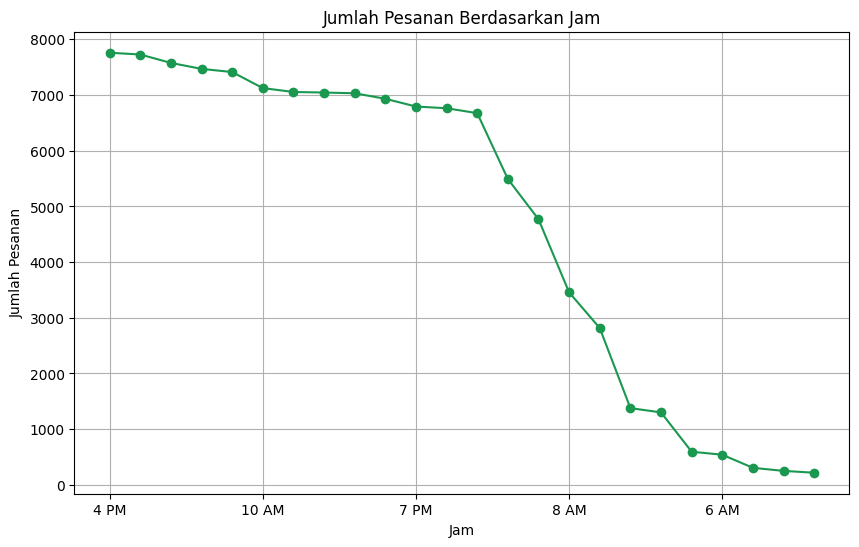

In [607]:
plt.figure(figsize=(10, 6))
hourly_orders_s.plot(kind='line', marker='o', color='#1a9850')
plt.title('Jumlah Pesanan Berdasarkan Jam')
plt.xlabel('Jam')
plt.ylabel('Jumlah Pesanan')
plt.grid(True)
plt.show()

**Insight:**
- Dari data ini terlihat bahwa kecenderungan orang memesan pada **siang** sampai dengan **sore hari**

In [608]:
orders_per_day_s

order_day
Tuesday      18626
Monday       18566
Wednesday    17860
Thursday     17128
Friday       16349
Sunday       13611
Saturday     12355
Name: order_id, dtype: int64

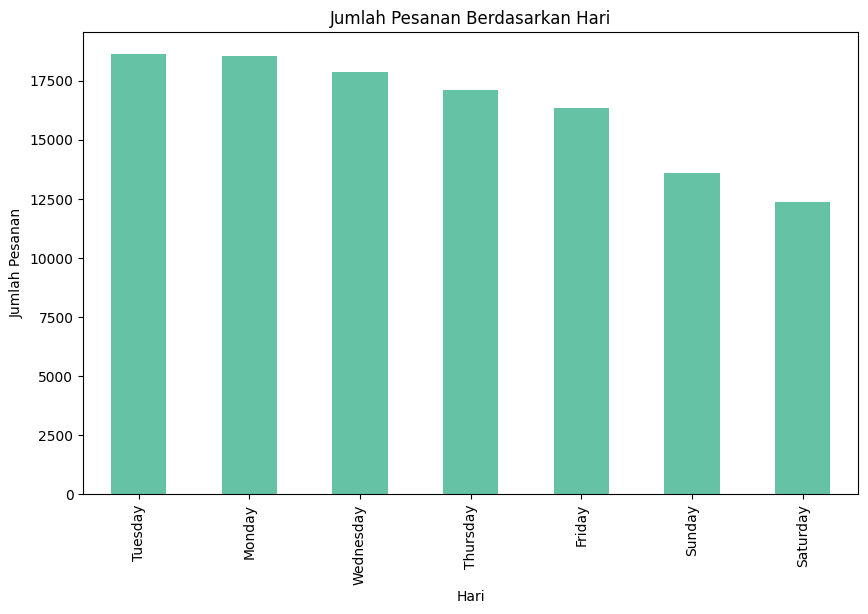

In [609]:
plt.figure(figsize=(10, 6))
orders_per_day_s.plot(kind='bar', color='#66c2a5')
plt.title('Jumlah Pesanan Berdasarkan Hari')
plt.xlabel('Hari')
plt.ylabel('Jumlah Pesanan')
plt.show()

**Insight:**
- Dari sini kita juga bisa melihat bahwa ternyata orang malah jarang yang melakukan pemesanan pada weekend (sunday dan saturday)
- Mereka cenderung memesan pada Tuesday, Monday dan Wednesday yang mana malah merupakan awal weekdays

In [610]:
orders_per_month_s

order_month
August       12334
May          12310
July         11862
March        11362
June         10947
April        10737
February      9711
January       9299
November      8799
December      6385
October       5767
September     4982
Name: order_id, dtype: int64

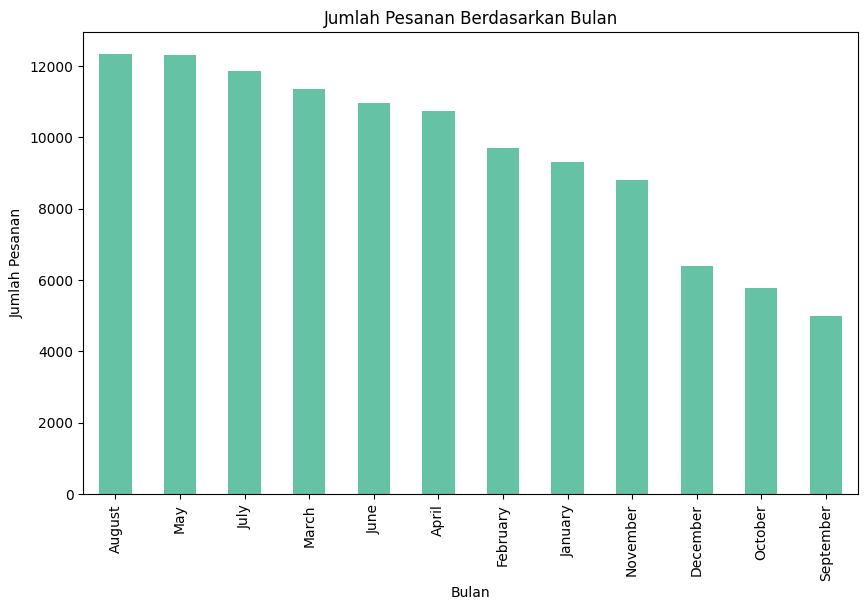

In [611]:
plt.figure(figsize=(10, 6))
orders_per_month_s.plot(kind='bar', color='#66c2a5')
plt.title('Jumlah Pesanan Berdasarkan Bulan')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Pesanan')
plt.show()

**Insight:**
- Dapat dilihat berdasarkan data tersebut, bulan agustus merupakan puncak waktu belanja di Brazil, dan setelah ditelusuri, ternyata salah satu alasanya adalah pada bulan `Agustus` di brazil pemerintah sedang adanya peningkatan pembayaran kepada penerima bantuan sosial, dan juga banyak toko yang mengadakan diskon besar besaran pada bulan itu untuk menyambut musim liburan akhir tahun. Selain itu pada bulan ini juga ada Hari Ayah di brazil.
- Dan pada bulan `Mei` di Brazil akan mengadakan banyak festival yang memungkinkan meningkatkan kecenderungan masyarakat dalam belanja.

### 3. Apakah waktu pengiriman yang lebih cepat berhubungan dengan review score yang lebih tinggi?



In [612]:
print("Korelasi delivery time dan review score: ", completed_order_geo_df["delivery_time"].corr(completed_order_geo_df["review_score"]))

Korelasi delivery time dan review score:  -0.2836638294030436


In [613]:
spearman_corr = completed_order_geo_df["delivery_time"].corr(completed_order_geo_df["review_score"], method="spearman")
kendall_corr = completed_order_geo_df["delivery_time"].corr(completed_order_geo_df["review_score"], method="kendall")
print(f"Spearman Correlation: {spearman_corr}")
print(f"Kendall Correlation: {kendall_corr}")

Spearman Correlation: -0.21799863821683113
Kendall Correlation: -0.17233534128507255


**Insight:**
- Jika kita lakukan uji hubungan korelasi sederhana ternyata tidak terlalu memiliki hubungan yang kuat antara delivery time dan review score.
- Tapi dalam hasil tersebut cenderung menunjukan korelasi negatif (meskipun lemah) disitu menjelaskan bahwa waktu pengiriman yang semakin sedikit maka akan berdampak juga dengan tinggi nya review score, meski lemah sekali hubungannya.

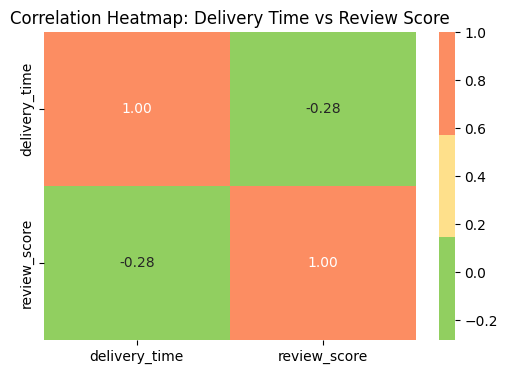

In [614]:
correlation_matrix = completed_order_geo_df[["delivery_time", "review_score"]].corr()

plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap=sns.color_palette(["#91cf60", "#fee08b", "#fc8d62"]), fmt=".2f")
plt.title("Correlation Heatmap: Delivery Time vs Review Score")
plt.show()

**Insight:**
- Berikut merupakan visualisai heatmap untuk korelasi hubungan antara delivery time dan review score.
- Dari data tersebut dapat disimpulkan bahwa delivery time memiliki pengaruh terhadap review score meskipun sangat lemah

## Analisis Lanjutan - Geospatial Analysis

### 1. Di kota atau wilayah mana perusahaan harus memprioritaskan pengiriman lebih cepat untuk meningkatkan nilai ulasan pelanggan?





**Tujuan:**
- Analisis ini bertujuan untuk mengidentifikasi kota atau wilayah yang memiliki **review score rendah** dan **waktu pengiriman yang lambat**. Dengan hasil ini, perusahaan dapat memprioritaskan perbaikan logistik di wilayah-wilayah tersebut untuk meningkatkan kepuasan pelanggan dan mengoptimalkan efisiensi operasional.


In [615]:
completed_order_geo_df.sample(3)

,order_id,customer_id,order_status,order_approved_at,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,product_id,seller_id,price,freight_value,product_category_name_english,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,customer_zip_code_prefix,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,profit_margin,order_hour,order_day,order_month
12810,b2904e4b8dc7f4317993cb7d645f1a85,6078d4d210247a79ca7559bff4d79ffe,delivered,2017-11-27 17:20:06,2017-11-27 16:58:45,2018-01-09 01:15:25,2017-12-26,28.5,99a4788cb24856965c36a24e339b6058,4a3ca9315b744ce9f8e9374361493884,89.90,19.500,bed_bath_table,cama_mesa_banho,1.0,credit_card,8.5,218.80,1.0,Recomendo,91225.0,RS,91225.0,-30.026373,-51.140394,porto alegre,70.400,16,Monday,November
31575,d04d69f547962363d9ddba414975a8cf,ad5bf58044ff40d216e23b93b611e0f9,delivered,2017-06-27 12:03:56,2017-06-27 11:00:17,2017-07-11 15:41:59,2017-08-08,14.0,41b43381a92451746dc1374dbbd4c43e,7c67e1448b00f6e969d365cea6b010ab,159.99,33.255,office_furniture,moveis_escritorio,1.0,boleto,1.0,216.63,4.0,Recomendo,54220.0,PE,54220.0,-8.086850,-34.990133,jaboatao dos guararapes,126.735,11,Tuesday,June
74312,9b2ed38884a6f4e144ec6ad371ac4112,5c9da7c46add2a59a17f6b8d5c795afe,delivered,2018-04-24 17:45:53,2018-04-24 13:40:09,2018-04-27 17:15:35,2018-05-11,3.0,ae2531af4f44882cd7daed3b429d8744,00720abe85ba0859807595bbf045a33b,14.80,7.390,housewares,utilidades_domesticas,1.0,credit_card,1.0,66.57,4.0,Recomendo,13092.0,SP,13092.0,-22.895407,-47.036053,campinas,7.410,13,Tuesday,April


In [616]:
completed_order_geo_df["delivery_time"].corr(completed_order_geo_df["review_score"])

np.float64(-0.2836638294030436)

- Pertama kita akan categorize dulu delivery_time dengan kategori `Cepat`, `Sedang` dan `Lambat` dengan menggunakan quartile

In [617]:
q1_delivery_time = completed_order_geo_df["delivery_time"].quantile(0.25)
q2_delivery_time = completed_order_geo_df["delivery_time"].quantile(0.50)
q3_delivery_time = completed_order_geo_df["delivery_time"].quantile(0.75)

def categorize_delivery_time(days):
  if days < q1_delivery_time:
    return "Cepat"
  elif q1_delivery_time <= days <= q2_delivery_time:
    return "Sedang"
  else :
    return "Lambat"

completed_order_geo_df["delivery_time_category"] = completed_order_geo_df["delivery_time"].apply(categorize_delivery_time)

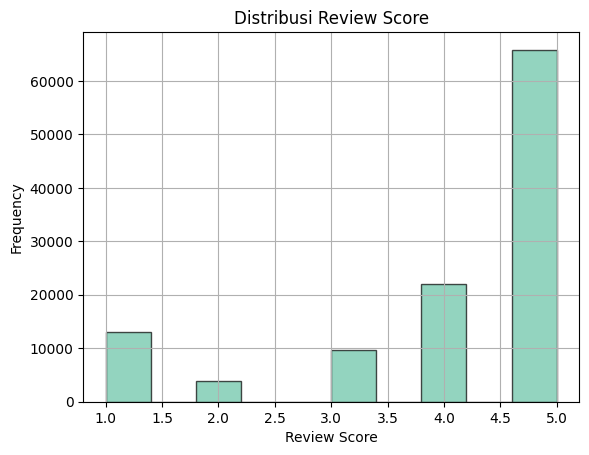

In [618]:
completed_order_geo_df['review_score'].hist(bins=10, color='#66c2a5', edgecolor='black', alpha=0.7)
plt.title('Distribusi Review Score')
plt.xlabel('Review Score')
plt.ylabel('Frequency')
plt.show()

**Insight:**
- Setelah itu kita juga categorize review_score
- Disini kita lihat distribusi datanya ternyata banyak yang review score di atas 4. jadi kita akan gunakan categorize dengan menentukan sendiri range nya
- Kita akan categorize baik dan tidak baik dengan rincian:

1.   Baik : >= 4
2.   Kurang baik < 4



In [619]:
def categorize_review_score(score):
  if score >= 4:
    return "Baik"
  else :
    return "Kurang Baik"

completed_order_geo_df["review_score_category"] = completed_order_geo_df["review_score"].apply(categorize_review_score)

In [620]:
completed_order_geo_df.head()

,order_id,customer_id,order_status,order_approved_at,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,product_id,seller_id,price,freight_value,product_category_name_english,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,customer_zip_code_prefix,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,profit_margin,order_hour,order_day,order_month,delivery_time_category,review_score_category
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,housewares,utilidades_domesticas,1.0,credit_card,1.0,18.12,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo,21.27,10,Monday,October,Sedang,Baik
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,housewares,utilidades_domesticas,1.0,voucher,1.0,2.00,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo,21.27,10,Monday,October,Sedang,Baik
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 11:07:15,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,housewares,utilidades_domesticas,1.0,voucher,1.0,18.59,4.0,Recomendo,3149.0,SP,3149.0,-23.577482,-46.587077,sao paulo,21.27,10,Monday,October,Sedang,Baik
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-26 03:24:27,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70,22.76,perfumery,perfumaria,1.0,boleto,1.0,141.46,4.0,Muito boa a loja,47813.0,BA,47813.0,-12.186877,-44.540232,barreiras,95.94,20,Tuesday,July,Lambat,Baik
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:55:23,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,19.22,auto,automotivo,1.0,credit_card,3.0,179.12,5.0,Recomendo,75265.0,GO,75265.0,-16.745150,-48.514783,vianopolis,140.68,8,Wednesday,August,Sedang,Baik


**Insight:**
- Seteleh kita mengategorikan delivery_time dan review_score, sekarang kita akan melihat kota mana aja yang memiliki delivery time yang `lambat` dan memiliki review score yang `kurang baik`
- Kita akan memetakan kota kota yang perlu kita berikan atensi lebih dalam hal logistik dan kualitas produk

In [621]:
filtered_attention_city = completed_order_geo_df[
    (completed_order_geo_df["delivery_time_category"] == "Lambat") &
    (completed_order_geo_df["review_score_category"] == "Kurang Baik")
][["geolocation_city", "geolocation_lat", "geolocation_lng", "review_score", "customer_state"]]

In [622]:
need_attention_city = filtered_attention_city.groupby(by="geolocation_city").size().reset_index(name="count")
need_attention_city

,geolocation_city,count
0,abaetetuba,7
1,abare,2
2,abatia,2
3,abelardo luz,3
4,abrantes,2
...,...,...
1987,xique-xique,1
1988,ze doca,4
1989,zortéa,1
1990,água boa,5


**Insight:**
- Disini kita telah mengelompokkan kota kota yang memiliki review score tidak baik dan memiliki delivery time yang lambat
- Ternyata ada **1992** kota dari **4164** kota
- Kita juga akan hitung persentasenya

In [623]:
need_attention_count = filtered_attention_city["geolocation_city"].nunique()

total_city_count = completed_order_geo_df["geolocation_city"].nunique()

attention_percentage = (need_attention_count / total_city_count) * 100

print(f"Persentase kota yang membutuhkan perhatian: {attention_percentage:.2f}%")


Persentase kota yang membutuhkan perhatian: 47.84%


**Insight:**
- Nah kita bisa lihat bahwa hampir separuh dari total seluruh kota customer yang memerlukan atensi
- Sekarang kita mau membuat dataframe baru dengan list kota dan latitude longitudenya agar kita bisa memvisualisasi tempat yang perlu diatensi

In [624]:
need_attention_city_df = filtered_attention_city.drop_duplicates(subset=["geolocation_city"])
need_attention_city_df

,geolocation_city,geolocation_lat,geolocation_lng,review_score,customer_state
12,rio de janeiro,-22.897213,-43.273353,1.0,RJ
25,sao paulo,-23.573007,-46.650038,2.0,SP
31,salvador,-12.937378,-38.446331,1.0,BA
37,palmares,-8.680194,-35.589012,1.0,PE
47,presidente venceslau,-21.875830,-51.844632,1.0,SP
...,...,...,...,...,...
115368,varzea da palma,-17.603253,-44.751136,3.0,MG
115435,braco do rio,-19.245934,-40.091153,3.0,ES
115582,rio negrinho,-26.255764,-49.520900,1.0,SC
115642,campo do tenente,-25.984014,-49.679103,1.0,PR


In [625]:
need_attention_city_df[['geolocation_city', 'review_score']].sort_values(by='review_score')

,geolocation_city,review_score
12,rio de janeiro,1.0
40037,itapora,1.0
40021,pacatuba,1.0
40020,igarassu,1.0
39979,patrocinio,1.0
...,...,...
11894,lagoa santa,3.0
11943,pato bragado,3.0
62571,arealva,3.0
65044,ipuiuna,3.0


**Insight:**
- Disini kita tampilkan tabel dengan list semua kota yang perlu perhatian dengan total 1992 kota

In [626]:
attention_city_map = folium.Map(location=[-15.7801, -47.9292], zoom_start=4, tiles="CartoDB positron", scrollWheelZoom=False)

def get_color(score):
    if score <= 2:
        return "#d73027"  
    elif score <= 4:
        return "#fee08b"  
    else:
        return "#1a9850"  

for _, row in need_attention_city_df.iterrows():
    folium.CircleMarker(
        location=[row["geolocation_lat"], row["geolocation_lng"]],
        radius=row["review_score"] * 2,
        color=get_color(row["review_score"]),
        fill=True,
        fill_color=get_color(row["review_score"]),
        fill_opacity=0.7,
        popup=folium.Popup(
            f"<b>Kota:</b> {row['geolocation_city']}<br>"
            f"<b>State:</b> {row['customer_state']}<br>"
            f"<b>Review Score:</b> {row['review_score']}",
            max_width=250
        ),

    ).add_to(attention_city_map)


attention_city_map_legend_html = """
<div style="position: fixed;
            bottom: 50px; left: 50px; width: 150px; height: 120px;
            background-color: white; z-index:9999; font-size:14px;
            border:2px solid grey; padding: 10px;">
    <b>Legenda:</b><br>
    <div style="display: flex; align-items: center; justify-content: left; width: 100%;"><i style="background: #d73027; width: 10px; height: 10px; float: left; margin-right: 5px;"></i> Skor < 2</div>
    <div style="display: flex; align-items: center; justify-content: left; width: 100%;"><i style="background: #fee08b; width: 10px; height: 10px; float: left; margin-right: 5px;"></i> Skor 2–3</div>
    <div style="display: flex; align-items: center; justify-content: left; width: 100%;"><i style="background: #1a9850; width: 10px; height: 10px; float: left; margin-right: 5px;"></i> Skor > 3</div>
</div>
"""
attention_city_map.get_root().html.add_child(folium.Element(attention_city_map_legend_html))

attention_city_map

###  2. Produk apa saja yang paling banyak terjual, dan di wilayah mana saja produk-produk ini paling sering dipesan?



**Tujuan:**
- Tujuan dari analisis ini adalah untuk memahami distribusi penjualan produk berdasarkan wilayah. Dengan mengetahui produk paling laris dan kota dengan permintaan tertinggi, perusahaan dapat menyusun strategi pemasaran dan alokasi stok yang lebih efektif untuk memenuhi kebutuhan pasar secara optimal.

In [627]:
best_products_df = completed_order_geo_df.groupby(by="product_category_name_english").agg({
    "product_id" : "nunique",
    "geolocation_city" : "first"
}).reset_index().sort_values(by="product_id", ascending=False).rename(columns={"product_id" : "product_count"})

In [628]:
best_products_df.head(10)

,product_category_name_english,product_count,geolocation_city
7,bed_bath_table,3549,sao paulo
65,sports_leisure,2806,brasilia
39,furniture_decor,2569,faxinalzinho
43,health_beauty,2390,sao paulo
49,housewares,2273,sao paulo
5,auto,1841,vianopolis
15,computers_accessories,1595,sao paulo
69,toys,1361,sao paulo
71,watches_gifts,1287,santo andré
68,telephony,1103,imbituba


**Insight:**
- Ini merupakan tabel product terbaik yang paling banyak terjual
- Selanjutnya kita akan lihat banyaknya produk yang dipesan pada setiap kota

In [629]:
fig = px.bar(
    best_products_df.nlargest(5, "product_count"),
    x="product_category_name_english",
    y="product_count",
    color="product_category_name_english",
    text="product_count",
    labels={"product_category_name_english": "Product Category", "product_count": "Product Count"},
    title="Top 5 Most Sold Product Categories",
    color_discrete_sequence=px.colors.sequential.YlGnBu
)

fig.update_traces(
    texttemplate='%{text:,}',
    textposition='outside',
)

fig.update_layout(
    xaxis_title="Product Category",
    yaxis_title="Product Count",
    title_x=0.5,  
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    plot_bgcolor="white",  
    xaxis=dict(showgrid=False), 
    yaxis=dict(showgrid=True, gridcolor="lightgrey"),
    legend_title="Category"
)

fig.show()

In [630]:
best_list_products_base_on_city_df = completed_order_geo_df.groupby(by=["geolocation_city", "product_category_name_english"]).agg({
    "product_id" : "nunique",
    "geolocation_lat" : "first",
    "geolocation_lng" : "first",
}).sort_values(by="product_id", ascending=False).rename(columns={"product_id" : "product_count"}).reset_index()

In [631]:
best_list_products_base_on_city_df.head()

,geolocation_city,product_category_name_english,product_count,geolocation_lat,geolocation_lng
0,sao paulo,bed_bath_table,1038,-23.713628,-46.687510
1,sao paulo,sports_leisure,727,-23.649979,-46.752760
2,sao paulo,health_beauty,683,-23.573007,-46.650038
3,sao paulo,housewares,673,-23.577482,-46.587077
4,rio de janeiro,bed_bath_table,605,-22.917083,-43.231033


**Insight:**
- tabel ini menampilkan best list product berdasarkan kota

In [632]:
best_category_per_city_df = best_list_products_base_on_city_df.loc[best_list_products_base_on_city_df.groupby('geolocation_city')['product_count'].idxmax()].sort_values(by="product_count", ascending=False).reset_index(drop=True)
best_category_per_city_df.head(15)

,geolocation_city,product_category_name_english,product_count,geolocation_lat,geolocation_lng
0,sao paulo,bed_bath_table,1038,-23.713628,-46.687510
1,rio de janeiro,bed_bath_table,605,-22.917083,-43.231033
2,belo horizonte,bed_bath_table,276,-19.913964,-43.976106
3,são paulo,bed_bath_table,237,-23.744911,-46.685270
4,porto alegre,bed_bath_table,150,-30.065529,-51.199891
5,campinas,bed_bath_table,136,-22.924854,-47.074117
6,brasilia,bed_bath_table,129,-15.803212,-48.097915
7,curitiba,bed_bath_table,120,-25.430074,-49.271490
8,guarulhos,bed_bath_table,118,-23.465825,-46.424610
9,salvador,health_beauty,115,-13.001547,-38.461967


In [633]:
best_list_products_base_on_city_df_map = folium.Map(
    location=[-15.7801, -47.9292], zoom_start=4, tiles="CartoDB positron", scrollWheelZoom=False
)

def get_color(product_count):
    if product_count <= 100:
        return "#d73027"
    elif product_count <= 500:
        return "#fee08b"
    else:
        return "#1a9850"

top_products_per_city_df = best_list_products_base_on_city_df.groupby('geolocation_city') \
    .apply(lambda x: x.nlargest(5, 'product_count')) \
    .reset_index(drop=True)

for city, group in top_products_per_city_df.groupby("geolocation_city"):
    product_list_html = "".join(
        [f"<li>{row['product_category_name_english']} ({row['product_count']})</li>" for _, row in group.iterrows()]
    )

    popup_content = f"""
        <b>Kota:</b> {city}<br>
        <b>5 Produk Terbaik:</b>
        <ul>
            {product_list_html}
        </ul>
    """


    avg_lat = group["geolocation_lat"].mean()
    avg_lng = group["geolocation_lng"].mean()

    
    folium.CircleMarker(
        location=[avg_lat, avg_lng], 
        radius=group["product_count"].mean() / 50,  
        color=get_color(group["product_count"].sum()), 
        fill=True,
        fill_color=get_color(group["product_count"].sum()),
        fill_opacity=0.7,
        popup=folium.Popup(
            popup_content,
            max_width=250
        ),
    ).add_to(best_list_products_base_on_city_df_map)


legend_html = """
<div style="position: fixed;
            bottom: 50px; left: 50px; width: 150px; height: 120px;
            background-color: white; z-index:9999; font-size:14px;
            border:2px solid grey; padding: 10px;">
    <b>Legenda:</b><br>
    <div style="display: flex; align-items: center; justify-content: left; width: 100%;"><i style="background: #d73027; width: 10px; height: 10px; margin-right: 5px;"></i>1 - 100 Produk</div>
    <div style="display: flex; align-items: center; justify-content: left; width: 100%;"><i style="background: #fee08b; width: 10px; height: 10px; float: left; margin-right: 5px;"></i> 101 - 500 Produk</div>
    <div style="display: flex; align-items: center; justify-content: left; width: 100%;"><i style="background: #1a9850; width: 10px; height: 10px; float: left; margin-right: 5px;"></i> 501+ Produk</div>
</div>
"""
best_list_products_base_on_city_df_map.get_root().html.add_child(folium.Element(legend_html))

best_list_products_base_on_city_df_map


/var/folders/hb/v__c04611159pwb1kk506kwc0000gn/T/ipykernel_36153/1190592400.py:14: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



- Tabel ini menampilkan produk terbaik pada setiap kota

## Conclusion

## Insight Hasil Analisis

### 1. Kategori Produk Berdasarkan Margin Keuntungan

#### Kategori dengan Margin Keuntungan Tertinggi
Kategori produk yang memberikan margin keuntungan tertinggi berdasarkan total penjualan dikurangi biaya pengiriman adalah sebagai berikut:  
1. **Bed Bath Table**  
2. **Health Beauty**  
3. **Watches Gifts**  
4. **Sports Leisure**  
5. **Computers Accessories**

#### Kategori dengan Margin Keuntungan Terendah  
Sebaliknya, kategori produk dengan margin keuntungan terendah adalah:  
1. **Security and Services**  
2. **Home Comfort**  
3. **Children Fashion**  
4. **CDs DVDs Musicals**  
5. **Flowers**

---

### 2. Waktu Terbaik untuk Promosi

Berdasarkan aktivitas pelanggan dalam melakukan pesanan, berikut adalah waktu terbaik untuk menjalankan promosi:  

#### Pola Waktu Harian
- **Waktu ideal:** Siang hingga sore hari.  
- **Waktu kurang aktif:** Weekend (Sabtu dan Minggu).  

#### Pola Mingguan
- Pelanggan cenderung aktif memesan pada awal weekdays, terutama:  
  - **Tuesday**  
  - **Monday**  
  - **Wednesday**  

#### Pola Bulanan
- **Bulan paling aktif:**  
  1. **Agustus**  
     - Puncak belanja karena adanya peningkatan bantuan sosial dan diskon besar-besaran menjelang musim liburan akhir tahun.  
     - Peringatan **Hari Ayah** di Brazil.  
  2. **Mei**  
     - Banyak festival yang mendorong aktivitas belanja.  
  3. **Juli**  
  4. **Maret**  
  5. **Juni**  

---

### 3. Hubungan Waktu Pengiriman dan Review Score

#### Hasil Analisis Hubungan
- **Korelasi sederhana:**  
  Tidak ada hubungan kuat antara waktu pengiriman dengan review score (**-0,28**).  
- **Temuan penting:**  
  - Korelasi negatif (meskipun lemah) menunjukkan bahwa waktu pengiriman lebih cepat **cenderung** berhubungan dengan review score yang lebih tinggi.  

#### Kesimpulan
- Perusahaan perlu memperbaiki logistik pengiriman, khususnya di kota-kota dengan:  
  - **Review score rendah.**  
  - **Pengiriman yang lambat.**  

---

### Analisis Lanjutan: Geospatial Analysis

#### 1. Prioritas Kota untuk Perbaikan Pengiriman
- Dari **4164 kota**, terdapat **1992 kota** (47,84%) dengan:  
  - **Review score rendah.**  
  - **Delivery time lambat.**  
- Perusahaan perlu melakukan analisis lebih lanjut terkait faktor keterlambatan pengiriman di kota-kota ini untuk meningkatkan kepuasan pelanggan.

#### 2. Produk Paling Banyak Terjual dan Wilayah Utama Pemesanan

##### Kategori Produk Paling Laris
1. **Bed Bath Table**  
2. **Sports Leisure**  
3. **Furniture Decor**  
4. **Health Beauty**  
5. **Housewares**  
6. **Computers Accessories**  
7. **Toys**  
8. **Watches Gifts**  
9. **Telephony**  

##### Kota Utama Pemesanan
1. **Sao Paulo**  
2. **Brasilia**  
3. **Faxinalzinho**  
4. **Vianopolis**  
5. **Santo André**  
6. **Imbituba**  


In [634]:
completed_order_geo_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114495 entries, 0 to 115655
Data columns (total 32 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       114495 non-null  object        
 1   customer_id                    114495 non-null  object        
 2   order_status                   114495 non-null  object        
 3   order_approved_at              114495 non-null  datetime64[ns]
 4   order_purchase_timestamp       114495 non-null  datetime64[ns]
 5   order_delivered_customer_date  114495 non-null  datetime64[ns]
 6   order_estimated_delivery_date  114495 non-null  datetime64[ns]
 7   delivery_time                  114495 non-null  float64       
 8   product_id                     114495 non-null  object        
 9   seller_id                      114495 non-null  object        
 10  price                          114495 non-null  float64       
 11  freig

**Insight:**
- Sebenernya masih banyak yang bisa kita eksplor dari data ini seperti seller, payment type, payment installment dll. Tapi dalam analisa kali ini mungkin belum dilakukan hehe 😀

In [635]:
main_data_df = completed_order_geo_df.drop(columns=["seller_id", "payment_sequential", "payment_type", "payment_installments", "payment_value"])

In [636]:
main_data_df.to_csv("main_data.csv", index=False)